In [1]:
import pandas as pd

df = pd.read_csv(r"D:\Research Assistant\Tweets\merged_tweets.csv")

In [2]:
df.head()

,Unnamed: 0,Tweet,Username
0,0,RT @1woo17: A gift from Jun for Valentine's Da...,PersephoneBasil
1,1,RT @miwon17_: Event for Valentines day in Chin...,PersephoneBasil
2,2,"RT @mansehao: 🐱: Hello, I am Confession Delive...",PersephoneBasil
3,3,RT @tinkswonu: wonwoo and his own sound effect...,PersephoneBasil
4,4,"RT @SVTGlobal: More info:\n\nThank you, CARAT!...",PersephoneBasil


In [3]:
# Cleaning the tweets
import numpy as np
import re
def remove_pattern(input_txt, pattern):
    try:
        r = re.findall(pattern, input_txt)
        #print(r)
        for i in r:
            input_txt = re.sub(i, '', input_txt)
            #print(input_txt)
        return input_txt
    except:
        print("An exception ocurred")
        
def clean_tweets(tweets):
    #remove twitter Return handles (RT @xxx:)
    tweets = np.vectorize(remove_pattern)(tweets, "RT @[\w]*:") 
    
    #remove twitter handles (@xxx)
    tweets = np.vectorize(remove_pattern)(tweets, "@[\w]*")
    
    #remove URL links (httpxxx)
    tweets = np.vectorize(remove_pattern)(tweets, "https?://[A-Za-z0-9./]*")
    
    #remove special characters, numbers, punctuations (except for #)
    tweets = np.core.defchararray.replace(tweets, "[^a-zA-Z]", " ")
    
    tweets = np.core.defchararray.replace(tweets, "[A-Za-z0–9]+", " ")
    
    tweets = np.core.defchararray.replace(tweets, "[⁰-9A-Za-z \t]", " ")
    
    tweets = np.core.defchararray.replace(tweets, "[\w+:\/\/\S+]", " ")
    
    return tweets

In [4]:
df['Tweet'] = clean_tweets(df['Tweet'])

In [5]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyser = SentimentIntensityAnalyzer()

In [6]:
#Finding scores for tweets
scores = []
compound_score =[]
positive_score= []
negative_score= []
neutral_score = []
for i in range(df['Tweet'].shape[0]):
    compound = analyser.polarity_scores(df['Tweet'][i])["compound"]
    pos = analyser.polarity_scores(df['Tweet'][i])["pos"]
    neg = analyser.polarity_scores(df['Tweet'][i])["neg"]
    neu = analyser.polarity_scores(df['Tweet'][i])["neu"]
    positive_score.append(pos)
    scores.append({"Compound": compound, "Positive": pos, "Negative": neg, "Neutral": neu})
    

In [7]:
sentiments_score = pd.DataFrame.from_dict(scores)
df = df.join(sentiments_score)
df.head()

,Unnamed: 0,Tweet,Username,Compound,Positive,Negative,Neutral
0,0,"A gift from Jun for Valentine's Day in China,...",PersephoneBasil,0.9312,0.498,0.0,0.502
1,1,Event for Valentines day in China by Jun\n520...,PersephoneBasil,0.0000,0.000,0.0,1.000
2,2,"🐱: Hello, I am Confession Delivery Company’s ...",PersephoneBasil,0.0000,0.000,0.0,1.000
3,3,wonwoo and his own sound effects!! the cutest...,PersephoneBasil,0.7156,0.356,0.0,0.644
4,4,"More info:\n\nThank you, CARAT!\n\n",PersephoneBasil,0.4714,0.434,0.0,0.566


In [8]:
## Function for labelling the data to postive or negative reviews
from tqdm import tqdm
def label_data1(dataset):
    label_data = {"Label": []}
    
    for i in tqdm(dataset["Compound"]):
        if (i < 0):
            label_data["Label"].append("Negative")
        else:
            label_data["Label"].append("Positive")
    
    data_label = pd.DataFrame(label_data)
    dataset = pd.concat([dataset,data_label], axis = 1)
    
    return(dataset)

dataset_tweet_vader= label_data1(df)
print(dataset_tweet_vader)

100%|██████████| 137439/137439 [00:00<00:00, 605973.68it/s]

        Unnamed: 0                                              Tweet  \
0                0   A gift from Jun for Valentine's Day in China,...   
1                1   Event for Valentines day in China by Jun\n520...   
2                2   🐱: Hello, I am Confession Delivery Company’s ...   
3                3   wonwoo and his own sound effects!! the cutest...   
4                4                More info:\n\nThank you, CARAT!\n\n   
...            ...                                                ...   
137434      137434  Tagging along with Credit Card Reform: More Fe...   
137435      137435  We may not be through with the flu - -dyn/cont...   
137436      137436  Tell Congress: Pass a good heathcare bill - in...   
137437      137437                reading from  ,8599,1966658,00.html   
137438      137438                                     reading from     

               Username  Compound  Positive  Negative  Neutral     Label  
0       PersephoneBasil    0.9312     0.498     

Positive    118969
Negative     18470
Name: Label, dtype: int64


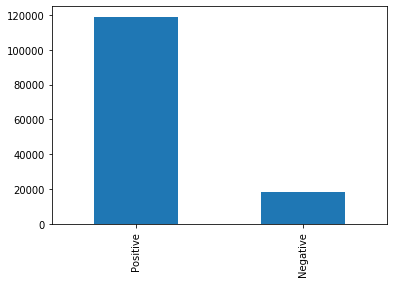

In [9]:
dataset_tweet_vader["Label"].value_counts().plot(kind = 'bar')
print(dataset_tweet_vader["Label"].value_counts())

In [10]:
dataset_tweet_vader.to_csv(r"D:\Research Assistant\Tweets\sentiment_analysis.csv", index = False)

In [11]:
# Tokenization
tokenized_tweet = dataset_tweet_vader['Tweet'].apply(lambda x: x.split())
tokenized_tweet.head()


0    [A, gift, from, Jun, for, Valentine's, Day, in...
1    [Event, for, Valentines, day, in, China, by, J...
2    [🐱:, Hello,, I, am, Confession, Delivery, Comp...
3    [wonwoo, and, his, own, sound, effects!!, the,...
4                   [More, info:, Thank, you,, CARAT!]
Name: Tweet, dtype: object

In [12]:
# Tokenization
tokenized_tweet = dataset_tweet_vader['Tweet'].apply(lambda x: x.split())
tokenized_tweet.head()


0    [A, gift, from, Jun, for, Valentine's, Day, in...
1    [Event, for, Valentines, day, in, China, by, J...
2    [🐱:, Hello,, I, am, Confession, Delivery, Comp...
3    [wonwoo, and, his, own, sound, effects!!, the,...
4                   [More, info:, Thank, you,, CARAT!]
Name: Tweet, dtype: object

In [13]:
from nltk.stem.porter import PorterStemmer
stemmer = PorterStemmer()

tokenized_tweet = tokenized_tweet.apply(lambda x: [stemmer.stem(i) for i in x]) # stemming
tokenized_tweet.head()

0    [A, gift, from, jun, for, valentine', day, in,...
1    [event, for, valentin, day, in, china, by, jun...
2    [🐱:, hello,, I, am, confess, deliveri, company...
3    [wonwoo, and, hi, own, sound, effects!!, the, ...
4                   [more, info:, thank, you,, carat!]
Name: Tweet, dtype: object

In [14]:
#stitch these tokens back together
for i in range(len(tokenized_tweet)):
    tokenized_tweet[i] = ' '.join(tokenized_tweet[i])

dataset_tweet_vader['Tweet'] = tokenized_tweet
dataset_tweet_vader.head()

,Unnamed: 0,Tweet,Username,Compound,Positive,Negative,Neutral,Label
0,0,"A gift from jun for valentine' day in china, ""...",PersephoneBasil,0.9312,0.498,0.0,0.502,Positive
1,1,event for valentin day in china by jun 520 con...,PersephoneBasil,0.0000,0.000,0.0,1.000,Positive
2,2,"🐱: hello, I am confess deliveri company’ deliv...",PersephoneBasil,0.0000,0.000,0.0,1.000,Positive
3,3,wonwoo and hi own sound effects!! the cutest!!...,PersephoneBasil,0.7156,0.356,0.0,0.644,Positive
4,4,"more info: thank you, carat!",PersephoneBasil,0.4714,0.434,0.0,0.566,Positive


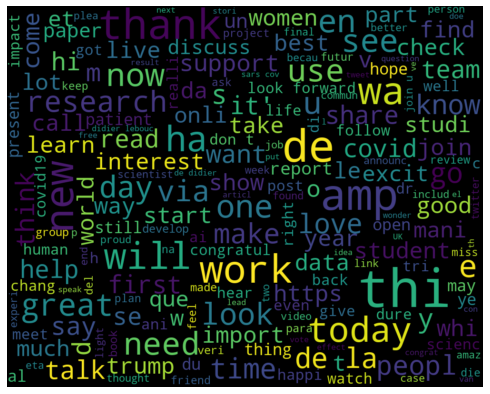

In [15]:
#What are the most common words in the entire dataset?
all_words = ' '.join([text for text in dataset_tweet_vader['Tweet']])
from wordcloud import WordCloud
import matplotlib.pyplot as plt
wordcloud = WordCloud(width=1000, height=800, random_state=21, max_font_size=110).generate(all_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

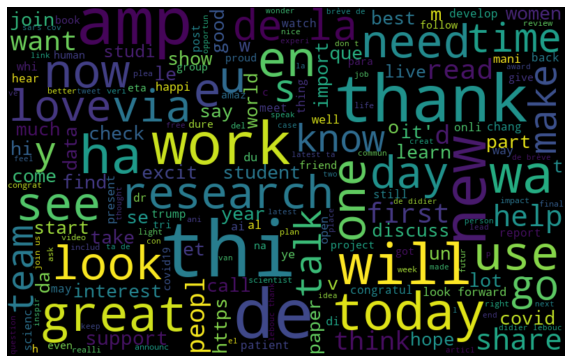

In [16]:
#Positive tweets
positive_words = ' '.join([text for text in dataset_tweet_vader['Tweet'][dataset_tweet_vader['Label'] == "Positive"]])
wordcloud = WordCloud(width=800, height=500,
random_state=21, max_font_size=110).generate(positive_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

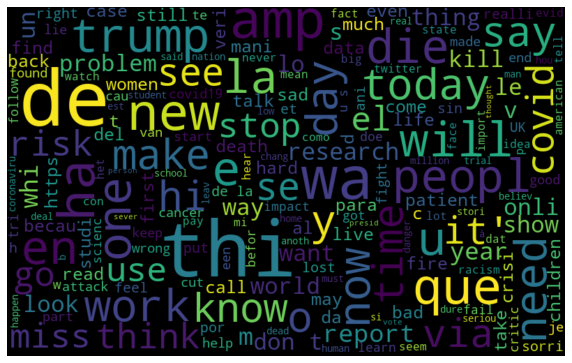

In [17]:
#Negative tweets
negative_words = ' '.join([text for text in dataset_tweet_vader['Tweet'][dataset_tweet_vader['Label'] == "Negative"]])
wordcloud = WordCloud(width=800, height=500,
random_state=21, max_font_size=110).generate(negative_words)
plt.figure(figsize=(10, 7))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis('off')
plt.show()

In [18]:
#nltk.download()

In [19]:
#pip install gensim

In [20]:

from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
import itertools, string, operator, re, unicodedata, nltk
from operator import itemgetter
from nltk.corpus import wordnet
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import TweetTokenizer, RegexpTokenizer
from bs4 import BeautifulSoup
import numpy as np
from itertools import combinations

from gensim.models import Phrases
from collections import Counter


def word_freq(clean_text_list, top_n):
    """
    Word Frequency
    """
    flat = [item for sublist in clean_text_list for item in sublist]
    with_counts = Counter(flat)
    top = with_counts.most_common(top_n)
    word = [each[0] for each in top]
    num = [each[1] for each in top]
    return pd.DataFrame([word, num]).T

def word_freq_bigrams(clean_text_list, top_n):
    """
    Word Frequency With Bigrams
    """
    bigram_model = Phrases(clean_text_list, min_count=2, threshold=1)
    w_bigrams = list(bigram_model[clean_text_list])
    flat_w_bigrams = [item for sublist in w_bigrams for item in sublist]
    with_counts = Counter(flat_w_bigrams)
    top = with_counts.most_common(top_n)
    word = [each[0] for each in top]
    num = [each[1] for each in top]
    return pd.DataFrame([word, num]).T


def bigram_freq(clean_text_list, top_n):
    bigram_model = Phrases(clean_text_list, min_count=2, threshold=1)
    w_bigrams = list(bigram_model[clean_text_list])
    flat_w_bigrams = [item for sublist in w_bigrams for item in sublist]
    bigrams = []
    for each in flat_w_bigrams:
        if '_' in each:
            bigrams.append(each)
    counts = Counter(bigrams)
    top = counts.most_common(top_n)
    word = [each[0] for each in top]
    num = [each[1] for each in top]
    return pd.DataFrame([word, num]).T


C:\Users\User\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:144: FutureWarning: The sklearn.feature_extraction.stop_words module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.feature_extraction.text. Anything that cannot be imported from sklearn.feature_extraction.text is now part of the private API.
  warnings.warn(message, FutureWarning)
C:\Users\User\anaconda3\lib\site-packages\gensim\similarities\__init__.py:15: UserWarning: The gensim.similarities.levenshtein submodule is disabled, because the optional Levenshtein package <https://pypi.org/project/python-Levenshtein/> is unavailable. Install Levenhstein (e.g. `pip install python-Levenshtein`) to suppress this warning.
  warnings.warn(msg)


In [21]:
'''Plotting'''
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')

'''Display'''
from IPython.core.display import display, HTML
display(HTML("<style>.container { width:95% !important; }</style>"))
import warnings
warnings.filterwarnings('ignore')
pd.options.display.float_format = '{:,.2f}'.format

In [22]:


cl_text_list = dataset_tweet_vader['Tweet'].tolist()
for tweet in cl_text_list:
    print(tweet)
wf = word_freq(cl_text_list, 20)
wf.head(20)

A gift from jun for valentine' day in china, "fall in love" ✨ love the song! 🥺
event for valentin day in china by jun 520 confess express deliveri company.🤍 #bbmastopsoci 🔗…
🐱: hello, I am confess deliveri company’ deliveri worker, qiupi jun #문준휘 #준 #jun #文俊辉
wonwoo and hi own sound effects!! the cutest!!!! for #bbmastopsoci
more info: thank you, carat!
carats, pleas spread thi inform about choic music LA sale reflect on gaon, hanteo, and billboard chart through…
US carats, here' an account that you definit need to follow 👇
rememb if you'r from the US to order from amazon or target instead so it'll count for billboard !! i’m vote for …
te amo infinito perrito yoga lo ha hecho genial que lo sepa
US carats!!! pleas consid buy from target as well🥰❤️
A main vocal that work on choreographi too? We love to see that!!!!🥰🥰🥰🥰
dokyeom: main vocal posit He wrote song + help out give idea to creat choreography.. he also ha a wide vocal range…
[#seventeen japan news] 「ひとりじゃない」パフォーマンス映像ビハインド（part1）を

A #deeplearn classif scheme for brain #cancer patients. #bigdata #machinelearn #datasci #ai …
#ai #aiinthekitchen
#ai is not necessarili new.. 4 key to unlock and acceler the #ai4biz conversation. #machinelearn #deeplearning. #cl…
want to be a speaker at thi year' #datagovern financi servic conference? submit by april 17! #dgf | …
i’m go to shut down a coupl of block on walnut st. in #philly. If you’r free on wednesday, it’ gonna be fun.
whi great #cdo #chiefdataoffic are hard to find via
#dataanalytics: new way for intern #auditor to appli their skill
"data sieve" help quickli transit leas to compli w/ leas account standard asc 842. #pwc #leas #asc842 http…
. &amp; deliv integr #datacatalog and data wrangl solut #datamanageme…
whaaa? #roblox rais $92 million in fund for it lego-lik #virtual game world via …
check out #edw17 impress speaker lineup thi year-
pyramid of employe needs: are you #inspir #engag #satisfi employees? #ceo #chro #coo #cdo #cio #cdo #cmo #cso #ct…
Is your #datago

stop build new hospit and start improv deliveri of care
I hope thi year #wd doesn't get taken over by wander deathli shadows.that wasn't fun last year.
i got sick today and have to agre with your list. I also have an addit ritual, warm water + ginger root + honey.
agre 100%. last year I found a job that made me happi instead of just earning, made new friends, experienc new things.
look for someth to do today? just follow these 13 step from to greatness. (via )...
I hope thi day doesn't repeat itself over and over again (see bill murray) becaus i am sick as hell.
I hope you make it, actual you better make it :-) I won't miss it for anyth and we will make it epic.
If you haven't quit mcdonald and other fast foods, thi should help you quit.
and thi time I am definit attending.
hypovolemia, you need fluid. hope you feel better.
are you go to #wd thi year. I won't miss it thi time for sure.
#wd here I come. 200 tix gone in 2 mins, wow. ()
hit refresh for #wd
proud that I have kept thi up so

play with visualis of lidar data #lidar
did harri potter fan get obama elected? #harrypott
long await re-issu of Hi score from on
"the yorkshir dale famili who are design entir citi in iraq" …
thank you plymtre countri fayr for such an awesom 2nd hand book stall
nice nautilu found in the quarri yesterday
thi is a bit sad. farewell, tolkien' black pine tree
got my copi of "the upper culm valley before, dure and after the great war" last night.vit local histori in print
siberian elder vote to reburi 2500-year-old mummi with angri spirit to prevent more disast ht…
check out your path - result may be shocking. #creepi #invas of #pri…
kickstart hope promis high-r aerial map for the mass via
big grant mean just £8k to go- pleas keep giving! http:/…
"some are born great. some achiev greatness. some get it as a graduat gift" - robin william on privilege.
need to blow off steam? john mcafee’ brownlist is here via
archaeologist shock to find 5,000-year-old battlefield in prehistor cardiff
test o

so, here is my question: at what specif dollar valu doe the risk of be too big becom bigger than the risk of be too small?
one should be frugal with the taxpayers’ hard-earn dollar and support competit condit in product markets. buy american d…
what are opportun and issu in tech polici that the biden administr will face? I discuss in my latest piec at …
fox news: aaf presid discuss the implic of rais the feder minimum wage to $15 an hour. …
under presid biden’ propos to extend and expand paid sick, family, and medic leave, larg employers, who would be required…
don’t be sad. condit on be from illinoi (land of socialist underfund everything)....
I agre with everyth but “awesome”.................
the dumbest thing in the world would be to regularli send these checks.
the biden administr make it clear: agenc need not worri about minim regulatori cost and will be abl to count on oi…
despit it broad deregulatori posture, the trump midnight rule were so slant to the cost-increas side that th

what’ in the senat financ committee’ latest propos on drug pricing? perhap noth that’ll knock your sock off, but there…
thank you!!! been investig my favorit drug. no, tara, that’ coffee!
h/t : chart show what' happen to "financi conditions" so far thi month, includ in comparison to last…
A real-tim payment system would be unquestion a public good. but the idea that the fed should build thi system ha numerous…
settl with facebook allow the feder trade commiss to preserv it power. but agenc power is not the best metric for suc…
the treasuri depart design china as a currenc manipulator. say it will ask imf to intervene? imf?? what will the…
kyle bass make the accur point that seem to be lost on some peopl that the chines aren't drive the rmb down; they…
In addit to conced it will take the fed 4-5 year to build real-tim payment rails, they note it like won't be int…
the guy who lost money sell steaks, vodka, gambl &amp; footbal may soon be pilot a global currenc war i'm sure i…
we’r in th

explain 's propos ace rule, with .
with less than two month remain in fy2018, the trump administr is well on it way to surpass it regulatori budget goa…
access to paid leav for famili reason is far more abund than mani assume. here' the full report that wa referenced: ht…
“while the sec’ propos regul is not without flaws, it is a signific improv over the dol’ rule…” aaf’ thoma wade…
the daili dish with : the drug price reform effort
independ of the fed, ani central bank, is key to avoid a debilit flare in inflation. chairman powel understand…
hous price are rise at a 6.4 percent annual rate, have been abov 4 percent for five years, and the rate of increas is accele…
In today’ daili dish with : Is hous the achil heel (again)?
suppli and demand you have ace you put charlatan in their place but rhyme is hard best left to the bard eakonom is…
neither good nor godly.
everybody’ a critic. alas....
"progress tout 'medicar for all' / So that nobodi will recal / their toxic singl payer / that h

qu'est-c qu'un #innov réussi ? répons dan ce quiz
qu'est-c qu'un #innov réussi ? répons dan ce quiz
the latest ta de brève de didier lebouc! thank to
conférenc : un regard décalé et souriant
l'agilité au quotidien dan le développ de produit matériel
La recett de l'innov réussi : seulement 4 ingrédient
stratégie, market et innov : notr expérienc à votr servic
4 ingrédient pour réussir une innov
no métier actuel sont le fruit de la productivité
the latest ta de brève de didier lebouc! thank to #ayatollah #chass
back in belgium after hi crash at Il lombardia, had a messag from the hospit for all those who sent…
Se repérer dan de environn commerciaux b2b et b2b2c complex
conseil et accompagn sur-mesur
the latest ta de brève de didier lebouc! thank to #girardg #coronaviru
Se repérer dan de environn commerciaux b2b et b2b2c complex
conseil et accompagn sur-mesur
quand la second guerr mondial racont la motiv d'une équip #agil
Un prix d'innov conduit-il à la réussit ?
the latest ta de brève de

peut-on être agil et.... ?
the latest ta de brève de didier lebouc! thank to #wef20 #ia
coru HY
coru HY
the latest ta de brève de didier lebouc! thank to #ia #wef20
#agilité pratiqu : où en est votr équip ?
4 ingrédient à rassembl pour mener une #innov au succè
the latest ta de brève de didier lebouc! thank to #smarthom #rediff
place grenette. #grenobl #iser
"le monstr exist mai il sont trop peu nombreux pour être vraiment dangereux ; ceux qui sont plu dangereux, ce sont…
busi plan : startup, fauteuils, pme même combat !
sportif sur la pelous
sportif sur la pelous
the latest ta de brève de didier lebouc! thank to #ia #scienc
maîtris le rouag d'un développ
comment entrer dan la tête de client futur
brume ce matin sur grenobl
Un peu de poker dan votr plan ?
#agilité pratiqu : fait le quiz !
«voilà vo encaiss en retard... et avec une avanc en plu !» — fernand naudin #linoventura #lestontonsflingueu…
Où est fabriqué le "made in china" ?
the latest ta de brève de didier lebouc! thank to #ia

think of becom an alli health professional? come and studi with us in the beauti citi of Y…
, student ambassador, alumni are look forward to chat to a…
great to hear you will be contribut to our decis day for applic - it is so help for them to hea…
what a great article! An import remind of the power of walk and how natur can inspir and e…
"pain scienc for non-pain specialists" An educ webinar for health profession with a differ A fun free &amp; inf…
wow 🤩 300!! 👏 👍
So glad you are covid neg 👍 love your jumper
are you a recent graduate? We current have two paid internship avail for 8 weeks. A research and develop internship…
i’d realli encourag anyon consid it to get the vaccin when their turn comes. It wa quick, painless and took about 3…
person &amp; meaning junctur in my #occupationaltherapi journey. flower bought by famili who’v alway believ in me,…
have you submit yet? still time
hope you’ll all be fine. My father had hi vaccin last week and said he bare felt it. He hasn’t had side

call for papers: bjot special issu on cancer rehabilit - deadlin now extend to februari 29. more on our open call…
congratul to Dr howarth ⁦⁩ award phd with veri minor amend 🎉 ⁦⁩
congratul Dr howarth!
chart success for edinburgh dementia patient and carer. what a wonder stori ⁦⁩ ⁦⁩ ⁦…
So impress with our band 6 occup therapist with thi piec of work about “parent as an occupation” https:/…
veri interest review in lancet. worth a read, if you'v got time. what work in inclus health: overview o…
and just like that it' over. So proud of us all present our research today in our last ever msc occup therapi a…
thank you and the rest playback theatr group for facilit our end of 2018 msc program…
thi includ occup therapist soc - pleas retweet....
it' alway a blue sky day over york St john* 🌞 (*definit not a lie) #weareysj
thi is my favourit photo of the one taken 🤣
mee too!
contribut to two key rcot resources. is ask for members’ feedback on the draft version of two key resources.…
ooooo, worth 

"in my lifetim I have and will live a thousand extraordinari live through reading, but despit these wonder adventur I w…
An amaz few day at #rcot2019 so mani thought run through my head, of convers and questions.........look f…
here is the link for more inform and to book on the acs-uk one day cours on 5th juli 2019…
the new chair of is a big contributor to #otalk thank for all you support over the year #rcot2019 #ota…
A music farewel to on her retir - are sing 'perfect day' to accompani a slideshow of some of…
fantast twitter activ for #rcot2019 lot of activ from occup therapist follow at a distanc too …
occup therapist overwhelmingli endors research as core to our profession ident at the #rcot2019 debat with 30…
present of student as co-research project:a critic review of occup therapi intervent for militari pe…
My term of offic as chair of council ha started. find out more at:
york St john univers is proud to support ‘time to be out’, a new charit initi in york support lgbqt asy…
th

absolut star! 🌟🌟🌟
‘the opportun for scotland are much greater outsid the union’ english-born luka from edinburgh make a journey t…
thank you. ye we are proud of him.
great to see our son lucas, , a social polici &amp; polit student comment as a member of t…

So the good news is that it is now an actual book and thi whole thing is not just one of olive’ scams. publish a we…
": RT if you agree… "amen love me pet I don't mind vacuum n dust everyday
thi littl ray of sunshin pass her medic with fli colours. she work herself into a giddi wreck (I think due to me…
some guidelin from here
congratul 🥳 mbe for lorrain abernethi for paediatr occup therapi &amp; the covid-19 respons &amp; mbe for paul dev…
congratulations. hear you submit your thesi just as you were go into labour!
equal pay
I have book to attend the fri 23 oct live stream. love ❤️ andrew’ oliv and mabel commentari
love these commentari 😂🤣
check your local coronaviru risk level in seconds. protect your love ones. get the nh covid-

visit my new ward at bradford royal infirmari yesterday, excit to meet the team and get start in orthopedics! #newlyqua…
Do you know what an occup therapist does? We deal with the everyday activ that matter to peopl &amp; work acros…
i’m blind so can’t use a standard tape measure. On placement in orthopaed I use the appl ‘…
An excit campaign launch to recruit 26,000 more alli health profession into primari care today with health min…
saw the advert on TV for the first time yesterday- great to see thi campaign
I would realli recommend undertak thi role - I learnt so much when serv on the …
read our latest updat on coronaviru (covid-19), includ the govern action plan
If you’r a member of rcot and interest in becom a truste or director, appli befor noon on friday 6 march 2020 …
spread the word! apply! I did &amp; not one regret! …
hope it went realli well. I realli enjoy attend an…
sigita mingaila and soemitro poerbodipoero repres enoth in poznan, poland. zuzana rodova prese…
I am proud t

discov some of ’s occup at the #enothe2019 workshop about the wfot occup narr project! mo…
anoth great workshop on OT project in educ with displac person from colleagu and F…
now hear a ⁦⁩ student’ reflect on be involv in a collabor project with peopl engag with…
#enothe2019 obtain £5000 fund for materi for the occup group (craft…
⁦⁩ student organis a spring into action campaign ⁦⁩ and donat of toiletri were provid t…
power messag &amp; reflect on establish #occupationaltherapi in #bulgaria from liliya todorova at #enothe2019 …
fantast work, 😊 at #enothe2019 👇 ___ #occupationaltherapi …
⭐european network of occup therapi in higher educ ⭐ ⭐(enothe)⭐ follow great tweet live from thei…
some women at chariti for refuge ask for group to make jewellery, card &amp; cooking. OT student…
⁦⁩ a student as co-research (score) project evalu the charity’ service. thi is a published…
⁦⁩ explain that build relationship &amp; trust take time. they collabor with a chariti in nort…
⁦⁩ ⁦⁩ ⁦⁩ deliv worksho

I rememb find thi a veri use articl when it wa published. good to hear it mention and recommend again
dicki and in th…
I like the way clare hock ha written abou…
It also help to think about what it mean to…
#2ot503
the draft document look excel look forward to us be abl to share the final with members. https:/…
and what a course, we learn so much. thank look forward to implem…
fabulous!
do some prep for my #lego workshop at #rcot2019 (with the help of vespa). im determin to convinc the…
enjoy!
london function hand use cours completed. 30 participants. avg cours rate 9.4/10. feedback highlight increas conf…
good luck with your studi
thi week we have enjoy share messag from our young peopl #snowsfield #kmau for #mentalhealhawarenesswe…
😂


💚 thank you to everi singl individu and organis that ha been a part of #mentalhealthawarnessweek 2019! 💚 thi w…
So move by tonight' perform of come from away. On 9/11 I wa work on an acut MH ward work with distress peopl…
just watch david harewood: psy

for mani teenag girl in the develop world, pregnanc can be tantamount to a death sentence: ...
medic school that form a consortium can magnifi invest in #mede such as in mepi - in uganda, zambia and ethiopia #globalhealth
prof sewankambo say medic educ need to take into account need of the population, grad should b chang agent #gl ...
professor omaswa talk about produc hcw that are 'fit for purpose' train base on need
attend the mepi medic educ confer in cape town south africa, examin the link bw health system and #mede #globalhealth
photo: ghc fellow edison ndayambaj speak on global health partnership at the 2012 globem summit
G8 must not waver on commit to food secur and nutrit via
presid obama: “everi woman should be in charg of the decis that affect her own health.” #P ...
In india, help peopl use everyday tool 2 make birth safer. what doe it take 2 save a life? htt ...
learn the new econom vocabulary! for china "slow down" mean have 4-fold faster econom growth compar to usa ...
ho

preprint of our cryo-et work show the lumin ring, a novel structur of the gigant npc complex.
molecular architectur of the lumin ring of the xenopu laevi nuclear pore complex
cryo-em structur of serca2b reveal the mechan of regul by the lumin extens tail
our new preprint describ the molecular structur of primari cilia is out. some thing we found are quit surpris and…
the molecular structur of primari cilia reveal by cryo-electron tomographi
bewar of “bad ice”.
reprogram of sugar transport pathway in escherichia coli use a permeabil seci protein‐transloc channel…
here is the follow-up studi on the role of the inner scaffold !!! check the new preprint of thesi work:…
jean-françoi trempe, phd, ha been appoint director of the proteom platform at the ri-muhc. He bring extraordinari exp…
it' out !! our latest paper: A helic inner scaffold provid a structur basi for centriol cohesion. big congratula…
johanna' paper is out! mutant recombin tubulin and in vitro reconstitut allow us address some

epic phd meet today with #dreamteam #phdfri…
ye that' fine with me
great to meet eddi hall for test even made it on the tv! #worldsstrongestman
nice poster by student and in our rebt interest group today …
grow your own: graduat on hi journey to master &amp;now phd #lovestaff https:/…
. live on talk #socialiden &amp; #staffsxmasjump with https:…
christma jumper selfi with #staffsonxma
A power (and forensic) demonstr of the role of social ident in stress buffering: ht…
our #xmasjumperday for is thi friday! get involv #staffsonxma …
realli nice to offici meet 3 more new #sport phd student today #futureisbright https…
I got them now off jane. absolut delight with them. would like to thank both you and for all your support!
"I can't stand" not know my msc result #irrationalbelief need help
brilliant will look forward to you debut!
excit time ahead. So glad to be part of a great team!
great to welcom to the team today. 1st day of the phd journey with us …
free copies, ye free! Of our recent

evo što se čita u našoj kući!
sretan nam rodjendan 🙂!
ljetna tvornica znanosti u splitu je apsolutno-fantastično-izvranredna stvar za djecu, koju organiziraju apsolutno-…
kolega marko šolić je istupio jako hrabro i napisao ono što bi mnogi kojima je stalo do djece i njihov budućnosti…
"... and no, no, sky is not the limit! It is onli the beginning. lift off!" pogledajt i poslušajte, uljepšat će v…
evo videa diskusij između igora i mene jučer na zagreb book festivalu. posebna pozornost na igorovu podršku mojo…
propustili ste, pogledajt :-). četvrtak, 23. 5. u 16h00 na fer-u.
sutra smo na druženju u varaždinu, vidimo se 🙂!
drag stela, puno hvala na podršci 🙂!
vrijem je da stvari nazovemo pravim imenom i da si priznamo da ovako dalj ne ide. dosta je jeftin demagogij za…
šefica je sve u pravu!
dragi vanja, puno hvala na podršci!
split, prije dvije godine.
hvala dražen na podršci 🙂!
znanost je jedan od temelja modernog svijeta. podržit i vi znanost zajedno sa stotinama tisuća u cijelom svij

main coupl enter contest to have babi
shritej studi the real devineni nehrugari' manner and bodi languag thoroughli befor prepar for the role and did…
judaism bring god into the home in a way that christian rare doe
portlaoise' model 3 statu hang in balanc
watch 's ig livestream last night &amp; got a few make up tip to get thi look and wowowowowowo im shook t…
glitter strobing: the super #beauti all winter long look. #makeup via …
north devon couple' want ivf suffer from 'postcod lottery'
odaka yoga touch mani level of our experi while is firmli ground in the anatomi of the body... …
amorepacif celebr 100-million cushion sold global
aya natural, launch new, anti age vegan 100% natur night repair cream
here is the websit
melissa martel will take care of your makeup, pet portraits, &amp; tradit tattoo
after allergi problems, I feel so damn thank for my health now!😻💕 I appreci it &amp; my skin a whole lot more &amp; take…
evan rachel wood hair at 2017 critics' choic award
tip to save sen

intern flavor &amp; fragrances: time To take profit
student with autism take first plung into high school’ long-clos pool
the makeup secret behind lupita nyong'o' glow skin at the toni award
when is it time to worri when you experi bleed dure #pregnancy? #pregnancyproblem h…
new post: Is vitamin B6 good for nausea dure pregnancy? #b6 #dure #for #good #i #nausea #pr…
#yourewelcom
celebr get tattoo in the weirdest place
paul thoma anderson and daniel day-lewi return for 1950 fashion drama
bright young thing at men' presentation:
At the beauti shop today. everyon share their person stori about ali. 😀
vintag carv bovin necklac hand carv by sylcameojewelsstor via #etsyspecialt #int…
nesting, the unsung hero of pregnanc mileston
illustr imagin what “the baby-sitt club” girl would Be Up to today
have a woman in the WH doesn't increas my self-worth. I care about paid matern leav &amp; subsid child care. …
the 5 best liquid eyelin
for all you proud to be mommi one day, feel free to look at my v

recordar é viver: em 13/6/2013 uma passeata em são paulo foi violentament reprimida pela polícia de alckmin. uma da reinvindicaco era r…
acaba dia, acaba dia...
vejam essa carta de um brasilianista francê que estudava na sorbonn e decidiu acabar com sua vida. A quem possa interessar, minha desgr…
pode parec piada ma não é. realment o stf perdeu o senso do ridículo.
bookmaker: quem será president do brasil na segunda-feira que vem: A) dilma B) cunha C) temer D) renan E) maranhão F) lewandovski G) jon…
muito se tem discutido sobr o processo de impeach e muito se tem argumentado sobr sua legalidade. Um do argumento é a existência de…
Ao cair da noit saberemos...
cunha não é tão esssperto como parece. Se foss teria aprendido a não evitar aumento ao judiciário, bastaria ver o que aconteceu com dilma…
A imprensa no condicion a pensar que o president no brasil é quem de fato toma as decisões, quando na verdad o poder é partilhado com …
Só hoje: temer anuncia a criação do gsi, órgão de informa

A também pede para não divulgar essa imagem subversiva. não retweet com força, por favor. 😘 …
aqui está a página sobr diversidad sexual da apostila que o governador doria mandou recolher. ele não quer que ningu…
não esqueça o putin.
chancel ernesto araújo diz que mundo teria inveja do acesso do brasil a trump. por esta lógica, deveríamo ter inveja dos…
trump promet enviar lança-chama para ajudar governo bolsonaro a resolv definitivament o problema amazônico.
epa!!!! carlo bolsonaro publica lista de transaçõ suspeita que inclui o próprio irmão dele, flavio…
uma terceira vez: tempo, muito obrigado por est presente: as hiena se devorando e servindo ao deboch público! Eu o…
A ciência brasileira vai morrer. A situação de milhar de estudant que fazem pesquisa e dependem do cnpq é desesperador…
"fronteiras" representado!!!!
parabéns!
O que mai podemo esperar? extinção do projeto espaci por causa do domo? criacionismo na aula de biologia? eliminar o…
futuro depend de união da ciência e tecnolo

utilidad pública: pessoal cuidado o netflix no seu afã para competir com hollywood, está roubando a vida de certa pessoas. simples, um d…
Em 2015 ocorreu um fenômeno interessante. O psdb coloc a imprensa para bater firm no pt. com ou sem razão depend do observador. ma o i…
esqueceram de mim! você ai reclamando da vida, só por que estão sem grana, por que a namorada de você está pegando o porteiro, por que o …
paris, a cidad luz se tingiu de sangu uma vez mais. vítima contumaz da intolerância e de sua eterna capacidad de atrair facinora que p…
miss brasil 2016. afastamento do cunha e paz mundial.
O psdb considera desastrosa a defesa do cunha, eu achei ela muito boa, principalment se comparada às pauta bomba e as política misógina…
A abril mudando de lado.
sempr admirei fhc pela sua absoluta falta de noção. agora ele quer que a dilma renuncie, fala disso no momento em que mai do que nunca pr…
No livro no jardin da besta é apresentado a acenção do nazismo na alemanha entr as dua grand gue

recht populistisch vvd'er zijn weer een recht populistisch. volhardend onwaarheden verkopen om statushoud de sch…
De bijstand is in NL al decennia niet geindexeerd en volgend het nibud te laag om van te kunnen leven. #rutt gaat de #aow verl…
wow!
'in de provincie, waar nederland nog van on is.' harm bedoelt: waar nederland twintig jaar achter loopt. hou op met m…
nee harm. Je gaat onz onderdruk niet voor je islamofob agenda spannen. dat is niet alleen racistisch, het is door h…
kim toont zich een rechtgeaard racist. En #factfreethierry, die retweet het lustig.
hahaha, dronken-oom-aan-de-kersttafel statistiek:
lachen om de clown baudet, gapen bij grotesk retoriek, wennen aan de onverdraagzaamheid: het is de domst reacti denkb…
grati kersttip: boek geen sessi bij coach caroline. volgen mij kom je daar namelijk beroerd uit 🤡 transfobie. niet ec…
wooooow. deze is vet. En ik hou niet een van rotterdam
dit wa de laatst hord tot volwassendom, gefeliciteerd
jep die!
Ik geniet intussen gewoon v

dit verzin je niet. 😂
Ik heb zelden iet smerig gelezen dan dit. 'leuk voor de overig zwembadgangers.'
niemand op de boot zag er zo uit. iedereen droeg "normale" witt kleding. stelletj hypocrieten. volgend jaar thui…
De vrouwen knallen door 💪 ongelooflijk ! eerst WR onder 23
dit team IS goud!!!🏆🥇
btw, dutch women' team ha femal head coach, denmark male... dutch won BC the futur IS female! sarina wiegman - you'r…
hoi willen julli alsjeblieft een sprinter naar shanic v/d sanden vernoemen? #nedden
mijn zoon gaan ook op vrouwenvoetbal. punt uit.
i'm not say I watch the leak episod 4 of #got but I am say it may be one of the best damn episod i'v ever seen
fijn weekend allemaal!🎉
nou, d66. laat zien dat je wat waard bent vr de dieren. rug recht tegen relirechts bioindustriepartijen cda vvd cu!htt…
bedankt bedankt bedankt iedereen!! voor vandaag, maar ook voor al die mooie jaren! ❤️⚽️
De eerst tweet van wilders. wat een pareltjes.
rechts verkromtaling. baudet is een 'verademing', kritiek is 'k

finally, a candid who can relat to the littl guy — cartoon via ol&amp;c
NL urg countri to report on fight against impun in violenc against journo …
2016: first femal #potu + first femal #unsg. let' do this!
it' official!! So excited! #imwithh #hillary2016 #hillaryforpresid
history.
hillari clinton schrijft geschiedenis: ze is de eerst vrouwelijk presidentskandidaat ooit.🙋
esther () (winner tedxed audit event) is readi for #tedxed on october, 27th: will we see…
Do you think michel obama is beyoncé' beyoncé?
love how #hillaryclinton ha surround herself w/ such a fierc #girlsquad &lt;3. &amp; w/ bill obviously. #demsinphilli
quit weird actual that it' still call a first ladi speech. sound a littl outdat
bill clinton pull off a presidenti first: A first ladi speech deliv by a man via
haha. bestrijd haat met liefd enzo ;).
Ik nodig uit om een mee te gaan naar de #europride2016 want julli lijken geen ide te hebben wat het is..
yes. En aantrekkelijkst voetbal in tijden. In elk geval wat amste

titl featur lesbian joy exist and also it’ christma can We just let peopl love who they love 🎥 let It snow 📺…
hi fuck famili die in the holocaust you fuck piec of shit
dan kent pechtold weinig jong glers. allen die ik ken zitten vast in een te dure huurw…
mijn vriendinnetj introduceerd me tot de met-de-kruik-verwarmde-pyjama en ik denk niet dat ik ooit meer van haar…
bij willekeur allen toepasbaar wanneer nodig. De magi van hedendaags brede opleidingen ;)
jep. En mij, met mijn vrouwelijk partner is een te dure huurwon in de sjiek buurt omda…
De meest gler die ik ken kunnen niet een een 1e hui betalen, laat staan een 2e. Of bedo…
ben ik nou partijdig, teveel in m’n eigen bubbel? Of klopt mijn indruk dat we in een land leven waar multinationals, boeren e…
dit stuk wa een uitdag voor mij om te schrijven: over de period dat mijn vader dakloo was. De scherp toenam van…
veel ouderen brengen de feestdagen helaa alleen door. een kerstkaartj in de brievenbu betek veel voor hen. een kl…
kerstkaa

aangezien je toch de rest van je leven uit de kast blijft komen kan je het maar beter leuk maken voor jezelf :). fijn!
wat je ook van abortu vindt; het is echt een val frame dat vrouwen dit achteloo en zonder besef zouden doen. Ze hebben ge…
zelfd intelligent logica al topvrouwen die zeggen ze ‘nergen last van hebben’, terwijl we nog steed evenveel vrouw…
iedereen heeft het recht op toegankelijk zorg bij ongewenst zwangerschap. Op de dag van de anti-abortusdemonstrati van #…
#ikki - abortu is in nederland helema niet zo go geregeld al men denkt:
trust women and make the abort pill avail through GP and pharmaci in the netherlands. #ikkies…
#uva’ lott wil dat de abortuspil verkrijgbaar wordt bij de huisarts. Ze zett de campagn #ikki op. …
#uva-stud lott dijkstra (23) hielp mee met het opzetten van de campagn #ikkies. ‘het is belangrijk dat je kan kiezen voor v…
hoi kees, sonja hier. wil je mijn baarmoed aub niet vergelijken met een autostoeltje? het is een deel van mijn lichaam, f…
helem

Ik zou al lbgtiq'er graag ergen studeren waar ik niet bang hoef te zijn naar de WC te gaan. #welrelev
hoe heeft nederland al sterk #lhbtiq land deze regel nog niet?
docenten krijgen weer tij voor kwaliteit! top
De meest recent gezien? gaat helema over water en oceanen. machtig interess :)
hell yeah! some femal power to defeat 'mr. horrible' trump. #hillaryclinton #hillary2016
gender equal in 5 (simpele) stappen. een blog over het gender seminar van afgelopen week.
gender equal in 5 (simpele) stappen. een blog over het gender seminar van afgelopen week.
gender equal in 5 (simpele) stappen. een blog over het gender seminar van afgelopen week.
becaus it is usual either cold or rain &lt;3. (said the girl who' still wear a scarf today)
een medicijn wat een schaamteloze, misselijkmakend discriminati van interseks mensen is. bah!
"ja ik ben ziek, en nee, ik ben mijn ziekt niet". krachtig column in over #psychisch klachten #stopstigma
100+ research and clinician call upon the world health orga

#corinnehutton will today grace 10 down street with her presence, have been invit by the PM himself for a... https:…
there wa realli onli one option for today' #daviscupfin #shotoftheday. , take a bow!
congratul to all our podiatri student who are graduat today #gcugradu
thank to and all volunt who spoke to our 2nd year student about their experi of amput …
a veri good look "show and tell" project!!
total padel tour court at sandi lane barbados. what a facility. #sandylan #totalpadel
i'm fundrais for podiatri use . check out my page #justgiv
. congratul buddy! well deserved!
there are 17 day to go until the #daviscupfinal! #didyouknow ha repres great britain in 17 ties? …
padel court in bangor 3 day from completion. longer process than plan but will be fantastic. #eddieirvinepadel https:/…
fanci do a master degree? whi not pop in &amp; see me on wednesday at gcu from 2-6pm. podiatri open day 2015
breaking: ford &amp; gray are free to play with immedi effect after scottish rugbi success

#trump' #trumprussia cover-up is wors than the crime... see the tip of the iceberg. #trumprussia #fbi #comey
career counterterror offic say #putin pull off a "brilliant" coup — but #trump is head for impeach

. must remov from chairmanship of constitut subcommitte for hi insult to american of ever…
compani own by kushner set to get more than $400 mil from promin chines co. invest in kushners' NY tower https:…
paul ryan call 24 million poor folk losin' their insur "veri encouraging." 4 out of 5 sadist agree.
trump' findin' out hi "if a black guy can be presid how hard can it be?" approach is not workin'.
whi wa he use hi stripper name? what wa he tri to hide? tillerson use email alia to talk climate: NY AG https…
trumpcar will demolish seniors.
#resist
thi thread on connect between right-w extremist u.s. militia and russia:
it' not just trump. hi entir famili is profit off hi presidency, as if he' some third world tin pot dictator. https…
#deutschebank fine for #russian #moneylaund sche

almost a year ago.
andrew jackson’ indian remov act remov more nativ american nation to what is now kansas/nebraska. these northern…
As an arizona native, I love read stori like this. It give an amaz insight into the histori of the state. make…
tears. for all who have lost love one to covid-19.
joan miró - woman surround by bird - 1937
rufino tamayo - girl attack by a strang bird - 1947
joan miró, woman encircl by the flight of a bird, 1941
the elector colleg mean that becaus florida is a swing state, cuban american have much more polit power despite…

musé de lépidoptères. collect de papillon de tout le parti du monde. by delarue, (j.)…
Le mond de papillons, promenad à traver champ avec une préface de georg sand, suivi de lhistoir naturel de…
It wa the onli thing that worked. I had appeal through the medic center that treated…
I can top that. you onc save me more than $100,000 in chemotherapi bill by retweet me when I wa ha…
A reader say that after read thi recent column, he contact h

gracia por la invitación lupe!! go to dig out my activ stori from my student years! jajaja que gusto conoc y comp…
My taunton photo!
A magic moment from the summer when thi stun purpl emperor decid to drink some sweat from my finger! what a beauty!…
essa semana fiz a soltura dessa dua bela fêmea de leucanella viridescens, popularment conhecida como mariposa-olho-d…
there is an actual polit of citation, and it' on to us to chang it and open the network of citat to scholar at t…
eleph empathy! orphan olorien went without her mother’ milk for day befor her rescue. 4 month on, she’ still re…
four hundr shade of brown #phylogeni #euptychiina #butterfli ($)
I want!
My butterfli decid to start mate already, so I had to go on a night hike to get some thistl for them to lay their e…
such a good book, we'r excit for thi
We now have two member of the senat judiciari committe who have test posit for covid, and there may be more. I wish…
I work not to hate or wish death on peopl becaus that’ a slip

have I mention my new collect can be preorder at a discount? yeah? okay, just checking. In case, like, mayb you…
almost a year ago.
andrew jackson’ indian remov act remov more nativ american nation to what is now kansas/nebraska. these northern…
As an arizona native, I love read stori like this. It give an amaz insight into the histori of the state. make…
tears. for all who have lost love one to covid-19.
joan miró - woman surround by bird - 1937
rufino tamayo - girl attack by a strang bird - 1947
joan miró, woman encircl by the flight of a bird, 1941
the elector colleg mean that becaus florida is a swing state, cuban american have much more polit power despite…

musé de lépidoptères. collect de papillon de tout le parti du monde. by delarue, (j.)…
Le mond de papillons, promenad à traver champ avec une préface de georg sand, suivi de lhistoir naturel de…
It wa the onli thing that worked. I had appeal through the medic center that treated…
I can top that. you onc save me more than $100,

atlanta journal-constitut say trump pressur GA sens. loeffler and perdu to call for sec/stat raffensperger’ resi…
emili harrington' record-set ascent of El capitan
nyt: trump administr remov scientist in charg of assess climat chang
those kid are all of our children.
we'r get a lot of question about georgia, and we hear you - we'r excit to get start write letter for the january…
meet sodalia petiti, a petit new speci of skipper butterfli from the andes! …
thi most of all.
emili harrington becom first woman to free-climb El capitan in a day
these titl are perfect for the aspir scientist in your life!
the senat runoff in georgia are coming, and befor we can think about turnout, we need to make sure as mani voter as possib…
Ok people, now the real work begins. We have 10 year to get human and planet earth on a new, regen path. tim…
joe biden defeat presid donald trump the associ press declar joe biden the winner of a gruel campaign for the americ…
everyon check elect result like (ht )
the

kiitos. mäntysuopaliuo kaiketi myö auttaa?
ok. välitän tuon tietävämmäll
pensaassa on ollut rypistyneitä lehtiä ja kutistuvia marjoa, siksi sitä on tarkkailtu.
tarkemmin mustaherukkapensaassa lehden alapinnalla.
#vantaa 'n herättäjäjuhlien tunnelmaan pääsee #körttiradio 'n kautta jo alkuviikolla #herättäjäjuhlat htt…
joku yökköstoukkahan tuo. mistä päin ?
espoon iivisniemestä. seikkaili viinimarjapensaassa.
suomen ja vallankumouksen juhlat lähestyvät. säpinää varmasti riittää.
mikä kummajainen tämä on? kuka tunnistaa?
suomen ja vallankumouksen juhlat lähestyvät. säpinää varmasti riittää.
kesäpotretteja vuodelta 2016.
kesäpotretteja vuodelta 2016.
viisa mie !
populismi ulkopolitiikassa on vaarallista.
katsotaan: populisti ja paasikivi - aamulehti blogit:
asiallinen kirjoitu volaselta.
poskisolisti valmiina jussin viettoon! ;)
kun sytytätt juhannuskokkoa, muistakaa, että kokko tarkoittaa myö kotkaa. kokko on tulilinnun vertauskuva. …
teippi teke terää - ainakin terän jälkeen! :)
parempi 

ama izatea zer den konturatzen zara ardoa minions-en edalontzi batean edaten duzunean 🤦🏻‍♀️
má vale prevenir la demencias, porqu no se pueden curar en #con_ciencia, hoy
E T N A 📷=
No es má de 800 persona mayor de 100 año han "desaparecido" en euskadi. "no se sabe dónde están, si en…
euskalzal tald bat gara, kanpaina abiatu dugunak netflix-i edukiak euskaraz emititzeko eskatuz. sinatu eta zabaldu ezazu i…
🎬 #netflix|ek edukiak euskaraz ere eskaini ditzan, sinatu!
If you are interest in a paid internship dure your univers studi and want to know the world of research, we have a nu…
Si lo 10 nombr de consejero de rtve que se están dando son lo aprobados, definitivament podemo considerar que el co…
deialdi irekia! aurten ere (graduko edo masterreko) ikasl bila ari gera, udaran ⛱️ ordaindutako 2 hilabeterako praktik…
call opened! thi year again we'r look for (undergradu or master) student to carri out a remuner 2-month su…
convocatoria abierta! est año también buscamo estudiant (grado o mást

escándalo nacion Dr richard horton, editor jefe de the lancet. una de la revista médica má prestigiosa aquí en…
➡️aunqu pilló a todo con el paso cambiado, alguno científico como margarita del val han estado ir un paso por delant de l…
haurrek internet bidez gozatu ahal izango dute gaurtik aurrera ipuinaren ordua, astelehenetik igandera #kor…
san frantzisko auzoko hainbat bizilagunek grabatu dute bideoetan gertakaria: kale batean ertzainak gazt bat identifikatzen has…
[azken ordukoa] pedro sanchezek iragarri du funtsezkoak ez diren lanetan aritzen diren langileak etxean geratu beharko direla a…
accord to economist , itali &amp; spain lose respect 3% ($1.07bn) and 4% ($1.16bn) of their corporate…
zerocalcar «quattro regol di autodisciplina per resister dignitosament a questo tempo»
anoth work by david casanova and olatz uranga from our group exciton interactions,…
etxean internetik ez daukaten haurrei konexioa eskaintzen hasi da izarkom operadorea vía
haurrekin egiten ari garena oso krud

igandea derbi eguna izango da. athleticen aurka jokatuko du realak, anoeta estadioan #emakumeakanoeta…
epaileak zezenari esan ziona
pedro miguel etxenike: "kultuagoa izanda, presio taldeek manipulatua izateko arriskua txikiagoa da, eta ahalmen handiagoa du he…
eneko goia: "part zaharra eremu asea da, gaurtik aurrera"
cuando lo número no encajan. cuando te cuentan la bondad del turismo y que da trabajo. cuando ere una colonia de los…
O empezamo a gestionar el agua ya pensando en la incertidumbr que genera un escenario de cambio climático o llegaremos…
azkenean, albist on bat #lesbos|etik. -eko hiru suhiltzaileak errugab izendatu dituzt
"queremo ser viajeros, no guiris, en un complejo turístico global dond todo lo sitio se parecen porqu se han concebi…
bueno, pue lo ha escrito estupendamente, como siempr
▶️ bideoa: auto autonomora bidean gidari #teknopoli #teknologia
16 años. En shock. hecho probados, pero sin violencia no es agresión, es abuso. Lo dice la justicia. Y a mí ya no me cabe 

En espagne, le covid-19 met en lumièr le condit de vie inhumain de travailleur agricol migrant …
irailean "ahal duena salba dadila ahal duen moduan. hori izan da politika orokorra pandemian, ez baita izan haurrei eta haien f…
uno de lo último duelo a espada de lo que se tien constancia. tuvo lugar en parí en 1967 y enfrentó a lo polític…
"hemo tenido un contacto cercano con el viru en nuestro entorno de trabajo con un person extra de est fin de semana",…
quedan poco má de 3 semana para el inicio del curso escolar. mucha preocupación y dudas. euskadi apuesta por la presenci…
'the telegraph' también incluy al rey felip en la red de comision millonaria saudí
I don't know how to explain thi but thi cat repres the mood i'v been in sinc march.
hementxe, jendeari buruan sartzen pentsioak handiegiak direla, bidegabeak direla, sistemak ezin duela iraun... porrota iragarri…
peer review with harvard affili
historian zehar informatika munduan emakumeek jokatu dituzten paper garrantzitsuei buruz hi

klima aldaketaren ondorioak #donostia.n 2050. urterako. gorriz, uhold arriskuak izango luketen guneak, climat central ze…
aturri arroa, doniban lohizune, irun, pasaia eta donostia, orio eta zarautz, urdaibai, bilboko itsasadarra, muskiz... 2050. ur…
maldi-tof MS studi of macrocycl polyeth gener by electrophil zwitterion ring expans polymer of mono…
amaz opportun to join one of the best #physic depart in the world. 🇨🇭 is look for #compchem #comp…
berdez tintatu zaigu itsasoa 💚
🙋‍♀adi! lanaldi osoko lan kontratu iraunkorra eskaintzen da erredakzioko lantaldearen kudeaketa eta jarraipena egiteko, eta ida…
atención! El gobierno de irak ha apagado toda la luce de la plaza tahir en baghdad dond había mile de manifestantes. S…
📝objetivo en la vida: 81 años, activista y estilazo.
benta berriko bizilagunak funt putreen eta arduragabekeriaren biktima. vecina de benta berri, victima de lo fondo b…
after an upgrad to mac OS X #catalina I find I cannot run vmd! 😱
intern max planck graduat school fo

"se non legalizzi l’aborto o i matrimoni tra person dello stesso sesso, non sei part dell’union europea. incredi…
#domenicavotolega
ora a #capaci, con commozione, 27 anni dopo quel terribil 23 maggio. chi si divid sulla lotta alla mafia sbaglia. ch…
Ma c'eri anch tu? non sono riuscito a vederti sabato sul palco.
nessun "ma"; prorpio attraverso l'applicazion di regol giust si realizza concretament l'aiuto…
Il ritardo nell'approvazion da part di m5 in calo è chiarament strumental
abbiamo tutti contro, per questo domani a milano (piazza duomo, ore 15) è important esserci! scriviamo insiem la sto…
volto sorrident e mani apert
non servono commenti, ma azioni e... votazioni perché sappiamo bene chi ha causato questo e come tentar di porr r…
urg l'edizion italiana per facilitar la diffusion di questo libro apocalittico e quindi di speranza
È la natura eolica di m5
It sadden how mani peopl even after be inform keep on use whatsapp even if they tri telegram and often the…
diretta video?
talment

per non si può dire 'i bambini sono maschi, le bambin sono femmine' 😨! #ionondesisto firma anch tu su http…
CS - #gandolfini: "#bertocco non era malato terminal ma disabil lasciato senza assistenza dignitosa." #dat #testamentobi…
I #bambini sono #maschi LE #bambin sono #femmine. nel tempo dell’inganno universale, dire la verità è un atto rivoluzi…
it' itaituba
SI salvi chi vuole, IL nuovo libro DI costanza miriano


articolo da leggere, parola per parola, e da condividere. forza ragazzi, tenet duro e #stopinvasion …

La #tunisia svuota le carceri gli ex detenuti arrivano da noi ++ clicca sul link ++ …
onor alla #roncadin. Se al governo ci foss gent così, l'italia si sarebb risollevata da un pezzo! …
piena solidarietà a . un'eccellent sindaco che fa battagli giust a viso aperto. sono con lei... htt…
Un estratto dell'intervista a #gandolfini sul lavoro del popolo del #familyday, in edicola su : …
"a a former fetus, I oppos abortion." #rt if you are pro-life!
the minist claim their action

E cominciar a ridar il maltolto ai vessati lombardi?
La UE (in questo caso) ci vincola o siamo noi che ci lasciamo vincolare? chi l'ha votato renzi?
con dio nulla si perde, ma senza di lui tutto è perduto.
anti-kiev ralli in #zurich, #switzerland 5/07/2014 #savedonbasspeoplefromukrarmi #breakthesil "…
#break - militia command speaks: "forgiv us for not die in slavyansk" #novorossiya #ukrain #russia …
#lega propon aliquota unica del 20% per tutti, più detrazioni per redditi bassi. meno evasione, meno tasse. Vi piace?…
2 +2 =5 and repeat after me: "there are no #nazi in #ukraine" via #novorossiya
yesterday afternoon, idf soldier found the bodi of eyal yifrach, gilad shaar and naftali fraenkel. our thought are…
. A proposito di sarcofagi, il servizio web di unich.it mi dice che sta aspettando la riattivazion dei proxy…
. origin video in ukrainian russian transcript : english: …
breaking: israel ha reveal the name of #hama terrorist who kidnap #eyalgiladnaftali: marwan kawasm &amp; omar ab

dr. korhonen from tamper univers hospit gave a keynot speech on human neonat care for audienc of equin v…
found: one hunk of metal sit in a crater just be all weird.
tätä haastattelua oli hauska seurata! what a great interview to follow! :-)
what a dusti day on mars! remind me of bad air qualiti day in lo angeles.
bye bye birdies, see ya next year!! joutsenten muuttoporukan muodostelmaharjoitukset. ensi vuoteen! :-)
lone moon: pandora, seen orbit outsid saturn' kink and constantli chang F ring https…
o-ou, tenttikirja panttivankina!! :-d My book is held hostage! #muusa
syksy, #suomenhevonen ja hirvet horisontissa rymyämässä! &lt;3 #finnhors
muutama hatuka lisää teeren pesään! #aaltopromootio
huomenna hatuttaa!
hauska ylläti #tutkijoidenyo päätteeksi. #ylioppiloskirjoitukset #fysiikka tehtävänä oli ollut #sähköpurj #esail aiheen…
closer &amp; closer: enjoy beauti contrast in surfac textur of #67p. thi from 8.9km at 0653ut: #cometland https:…
Ei tässä tartt mitään 360°-kameraa, mull tule

concour rein elisabeth. fantastiqu live tv in belgium
applic portal open for phd program at and
b. v arnim/beethoven: da ganz menschlich treiben geht wie ein uhrwerk an ihm auf u nieder, er allein erzeugt frei au sich da ungeahnte.
thank to the organ brennecke, martinez, cochella, ameres, nodin for a fantast 2016 #microsymposium at the #imba! #rna rocks.
the european C. elegan meet in berlin is come up: june 1-3, program is onlin #ewm2016
we'r hire independ young group leaders!
abov all summit it is calm. In the tree-top you feel scarc a breath; the forest bird are silent, wait, soon you will rest as well.
video: u.s. presid obama and the first ladi tango with profession dancer in argentina
comp. genom cours w/ , , , , https:…
mani of history’ worst authoritarian start out as loser – and is a seriou threat.
a few year ago- my attempt to answer what we would learn if we would sequenc beethoven. plu piano music
the art of the fugu is heartbreakingli beautiful. pure passion.
"all menschen

scientist from have discov that engin a high-yield rice cultivar to have reduc stomat dens…
evalu of differ #fungicid and #nitrogen rate on grain #yield and bread-mak qualiti in #wheat affect by septo…
after heavi drought sinc earli may, we yesterday receiv more than the entir long-term mean juli precipit (66 mm)…
tenure-track posit avail at the new knight campu , a $1-billion project that will bring togeth multiple…
simplifi #ai landscap {infographic} #artificialintellig #chatbot #nlp #machinelearn #neuralnetwork #…
google' robot dog meet real dog for the first time #ai #iot #robot #robot #futur #technolog #techtrend #autom…
scienc breakthrough to advanc food and agricultur research by 2030. freeli avail report…
reminder. applic deadlin for the full professorship "data scienc in crop production" is in 3week (15.…
tydligt att det är vi i norra europa som drabbat av torkan
gene edit is gm, say the european court of justice. the rule howev contain a number of exempt for olde…
A few year 

haber programları i̇stanbul'daki boş cadd ve sokakları çekip "kims yok" diy haber yapıyor. hayret neden acaba..
yeni değer önerisi - temassız hizmet
türkiy büyük millet meclisi'nin kuruluşunun 100.yıl dönümünde mustafa kemal atatürk'ü saygı ve rahmetl anıyor, tüm çocukl…
tto a.ş. amacı ve görevleri hakkında görüşlerimi paylaştım. i̇lginizi çekebileceğini düşünüyorum. …
günde 8-9 saat aktif zoom'da teams'd geçiriyorum. öldüm ya 😨lütfen "4 gün internet de çıkma yasağı" getirilebilir mi? 🤣
bir projemizi daha kapattık. #tto izleyici hocamız teşekkür ederiz. …
❤ #antalya
tebrikl akdeniz tto. varlığınızla üsi̇mp ekosistemin güç katıyorsunuz.#üsimpplatformu#ihtiyacoldugundayaninizda
başta akademisyenlerimiz olmak üzere antalya girişimcilik ekosistemin ticarilestirm sürecinin hizlandirilabilmesi…
“klinik öncesi safha biyoteknolojik tıbbi ürünlerin arg ticari potansiyelinin belirlenmesi" başlıklı fizibiliteyle…
akdeniz tto yeni dönemd firmalarıyla is geliştirme, kamu destekleri, proje hazırlama

tübitak bi̇gg birinci aşama arayüz kuruluşları toplantısında süreçler hakkında bilgi paylaşılıyor. #bigg #tübitak …
alan koordinatörlerimiz ❤️ ppad - 23. pazarlama kongremizin hazırlık sürecind hakemlerimiz ile birlikt özveri ile çalışan…
alan koordinatörlerim içten teşekkürlerimizle! ❤️ gala yemeğimizden... #pazarlamakongresi
devamının olacağını düşündüğüm bu etkinliğin gözlemci olarak katılmak isterim.
pazarlama kongrelerin akdeniz üniversitesi pazarlama bölümü'nden hep tam destek var. #ppad #pazarlamaailesi #pazarlamakong…
bir avuç tohum zenginliktir 💪
özellikl antalya tarıma dayalı teknoloji üretimind maddi ve manevi destek aldığı taktird küresel aktörlerl reka…
küresel pazarda rekabetin yüksek olduğu da düşünüldüğünde türkiy uçak, otomobil vb ağır sanayi gerektiren üretim i…
dünya bunu konuşuyor ya biz?
basında akdeniz üniversitesi (22.06.2018) #akdenizdenhaberl
eğitimimiz son bulurken tüm katılımcılarımıza ve keyifli anlatımıyla hocamız prof. dr. C. ruhi kaykayoğlu'na teşekkür ed

alkışlanacak işler yapıyorsunuz… şuraya bir alkış emojisi…. bir de pazarlama bölümü’nü fakülte’y dönüştürürseniz… ht…
✨sinemanın işığı antalya'dan yükseliyor✨ i̇şt 53.'nin muhteşem tanıtım filmi 📽📺
çağdaş pazarlamanın etkisini eşimin satın alma davranışında gözlemlemek #kişiselleştirm
i̇zlandalı grup kaleo'nın buzul üzerind gerçekleştirdiği performan kaleo "save yourself" (live at fjallsárlón)
pew'in yaptığı araştırmaya göre dünyada dinler arasında nüfusu en hızlı artan müslüman nüfusu..
literatür girdim..
pozitivizmin öngördüğü nicel araştırma yöntemlerin aşırı bağlılık, bilim insanının "entellektüel zanaatkar" olmasını zorlaştırmaktadır. 🤓
1 ay önce 2.90 olan doların bugün 3.10 olmasına ben küçükken devalüasyon derlerdi.
avrupa'nın en küçük ülkelerinden biri olan hollanda'nın 2014 tarımsal ürün ihracatı 80milyar €. türkiye'd ise 17mi…
akdeniz üniversitesi kampüsü'nden kareler... #akdenizdeöğrenciolmak
olası en büyük gururumu, başarımı, sevincimi kaybettim bugün.. çok ama çok özleyece

"thi is an attack not just on paris...thi is an attack on all of human and the valu that we share."
Να περάσει anti-dop control ο άδωνις γεωργιάδης ζητούν μεϊμαράκης, κυριάκος μητσοτάκης και τζιτζικώστας …
pres. obama: "everi coupl of month we have a mass shooting...thi will not chang until the polit changes." …
the onli arguement you can make for owe a gun... Is "b-cuz I lov gunz!!" not for protection... #notogun #comedi
#κλιντον :ζητάς εμπιστοσύνη πριν δείξεις έργα. #τσιπρας :Η ελλάδα γέννησε τη δημοκρατία. παράλογο? #λαϊκισμός
Το μνημόνιο και η θεσμική παρακμή | από τον χαρίδημο τσούκα #topotami
την τρίτη συνάντηση φίλη με ιερώνυμο για απολογία.αφηστε του αρμόδιους να κάνουν την δουλειά τους-να αποφασίσουν αυτοί για τα #θρησκευτικά !
Τα ίδια λέει και ο άνθημος
κατατοπιστική συνέντευξη - θα ήθελα να δώ αυτό το άτομο σε θέση ισχύος - έχει να προσφέρει #metonkyriako
επιβάρυνση αγορών λόγω διαδηλώσεων - κλείνουν δρόμους για να καταγράφει η δράση τους - ανάγκη για όρια. #θεσσαλονίκη
τον 

La ministr de la mer , présent sur le bateau comité, s'adress à tou le concurr avant qu'il prenne…
📣 voici #virtualnautic, notr projet de salon nautiqu virtuel, dévoilé à la press via une conférenc digital il y a quelques…
[#confinement] : Ne pa sortir en mer en cett périod de crise sanitaire, c'est préserver le secour et le personnel soi…
le 33 skipper du #vendéeglob sont en mer depui plu de 24h et nou feront rêver de dizain de jour durant. faite…
#vendéeglob ⛵️ Ça y est le #vendéeglobe2020 c'est partiiii 🥳 bonn chanc à tou le particip 🌊 Et n'oubliez pas…
#bonvent #vg2020 ⛵️ | 75 bateaux de lycé françai du mond 🌍 #aef ont pri le départ du pédagogiqu virtuel…
ce imag ! ce émotion ! que de frisson !!!!! géant ❤️❤️❤️🌊 🌊 merci
premièr vidéo du bord de ! émotion et remerci de la part de notr marin #solidair en #solitair…
✨ On a beau se projeter... imposs d’imagin la puissanc de émotion d’un départ de ! Il a fallu de g…
[#confinementacte2] #restezchezvous, c'est aussi éviter de déployer le 

bravo ! limit l’hécatombe. -tester tout le ehpad (❕ne pa oublier établiss handicapés, psy…)…
d'un élan de solidarité local à une opérat national ❤️😷💪 On vou expliqu sur le blog comment l'initi #1masque1s…
«sou le yeux effaré du monde, l’ind a révélé son aspect le plu honteux, son systèm social inégalitaire, brutal, str…
🙈
"la solut : une « architectur de l’attent » permett de guider le individu là où leur talent serait le plu apt…
6 avril 1971 : mort d'igor stravinsky. Il aura été le picasso de la musiqu du xxe siècle. explorateur de lui-même, doté…
pa besoin de sortir pour s'échapper✌🏻 you don't need to go out to escape✌🏻 compagni emka / confinect épisod 2 enj…
Le mond d’aprè selon moi😡😡😡: esther duflot soit 1 écrivain, 1 philosoph e…
bonsoir #pari ☀️☀️☀️🙏🤞🤞👏👏👏 #merci
🚒📽️ #coronaviru | parol de #pompier sur le #covid19 : "no famil savent qu'on part sur ce type d'intervention. el…
La foli de oyas. ce récipient d'argil cuit enterré dan le sol sont utilisé pour hydrat le plantes... et po

He wa outspoken for year about russian threat and anti-democrat behavior around the world. unli…
CA need to hold a special elect to repeal the balanc budget act, and float a covid relief bond to help unempl…
So that’ whi bayesian are so focus on their posteriors?
heh. wa in temecula yesterday. christmas. onli lgb showed.
despit have month to develop them there appear to be no plan to conduct vaccinations. health care worker are…
i’m fairli optimistic. lot *could* go wrong but with a new admin facilit implement and new v…
peak infect should be earli januari (~1/3; ~2 day after new years), peak death ~3 week later. mu…
that. right there. whi i’ll never volunt to serv as an editor. godspeed.
first, congrats! veri well done! second, that' an incred cover!
"active" is do a lot of work in that sentence.
live in palm but wasnt at ucla then. culver citi and SM "big blue" buse excel (way…
local news in LA report they’r move it becaus nort dame promis to pull out if they co…
Go corsairs!
ha: poo

Us too. most care about research. but it secondari to their teach needs.…
three year ago i had a student with 0 pub who got 2 offer on 3 interviews…
and immigr reform!
sound like a question for !
dieter ruhl kill it. even if he did leav out jane' ocean size, thi is grade A trolling.
thank for your hard work on this!
yep. apsa in SF wa $1700 for me and that wa onli 3 days, share a room, fli from socal, and use public transport.
thread
4. these graph underst the variabl of player in roughli the bottom 2/3 of the graph as player who were no…
3. the further one goe down thi list the fewer list a player wa includ on, and therefor the greater variabil…
2. not all player are includ on all lists. for example, spencer knight wa on onli 7 lists, but those rate him…
notes: 1. Of cours the actual draft will diverg for numer reason (e.g., draft for need; nhl team order a…
also, sword do not seem to be expressli prohibited.
but at least your uncontrol substanc were aok.
"consensus" 1st round #nhldra

oh, kris. i'm so sorry. think of you out here.
remind -&gt;
interest implic of the religi right’ embrac of tradit liber legal doctrine.
oh, I want thi if you find it. I am struck everi time I see the stat about the coloni have a…
great interview on sport contract negoti with my old hockey buddi jim nice.
whi is the right upset about incivility? whi the doubl standard? demand for civil come from those who see them…
sobering.
plus, teach the constitut will be so much quicker without all that "due process" mumbo jumbo. feel great a…
feel great again yet america?
fantast advic about how to studi for qualifi exams.
awesome, thank (and congratulations) rg! thi look ver…
ani chanc they circl back to grabner if avail at a reason price?
thirti year of data show "refuge burden" is a myth
wait till he meet vilardi! they are gonna be fantast together.
good at everyth not except at anything. read like a recip for a bottom six forward. so…
good at everyth not except at anyth
kupari or bokk are my gu

pour #torah, devient adult celui qui est apt au travail, et l'âge mentionné, en l'absenc de maladi et de handic…

voilà com'ça si on veut me demand (si on est pa au courant), ou si un jour on soign assez mon do - pour ce ki…
j'ai peaufiné mon CV avec quelqu précision et détail complémentaires. également en version pdf :…
Et en 2020 procureur écrit et sign ke calomnie, escroqueri en band organisées, abu pouvoir, déni preuv et cr…
pharmaci vient appel 🥳 vaccin gripp livré 😁 parait ce genr vaccin efficac 30-60% 🙄 1ère foi me sui fait vac…
documentair "big pharma, labo tout-puissants" via
Si #fakenew : privatisation-libéralisme-commerc service-publ illégal en franc nations-unies, enfrein…
théori #santé #aid #justic commerc anticonstitutionnel illégal #servicepubl …
🇫🇷 public de hebrew calendar 5.6 💻 génère un #calendri #lunisolair #hébraïqu avec rappel d'évènement 🏠…
🇬🇧 releas of hebrew calendar 5.6 💻 gener a #hebrew #lunisolar #calendar with event remind 🏠…
Et qui y a-t-il de plu sacré qu

it’ our #jewishprivileg to be abl to spread the true fact of what judaism is versu what zionist ‘claim’ it is. jew a…
wa feel sad, thi view perk me right up! colchuck lake, WA 2978x2978 [oc]
covid existerait pa ? mai quell absurdité franchement. évidem que covid existe, comm…
Le pire c’est que certain personn pensent à tort et diffus que le covid n’exist pa 😡 dois-j rap…
covid existerait pa ? mai quell absurdité franchement. évidem que covid existe…
scottish highland [oc] [7687x5304]
l’islamophobi n’a pa sa place au sénat! #mediapartclub
coronaviru : de médecin réclament "le masqu obligatoire" dan le lieux public clo il demand aux françai de se re…
articl "voici à quoi ressemblait vraiment un T. rex, et il est trè différent du monstr de jurass park" via…
coronavirus: le pharmaci autorisé à réalis de test sérologiqu rapid
l'imag prend tout l'écran ! Du coup faut aller en ba pour voir le pin repos...
c'est cool pour ajout une petit cart de visit en haut de la page, comm sur linkedin !
pe

#memori is not just one ability. there are sever kind of memory, and #braininjuri affect some more than other …
month ago, promised, he would "absolut do safe zones" in syria. retweet and tell him syria need safe zone…
the fastest way to melt glacier &amp; flood the world' coastal cities: ignor scientist and do noth to stem the rise of co2
10 year ago: hypox anox cerebr ischemia, hemorrhage, hyponatremia -- do veri well nowaday
thank you= abi &amp; tbi
jesu fuck wow
I invit you not to build wall but bridges, to conquer evil with good, offenc with forgiveness, to live in peac with every…
In honor of #stpatricksday read about our green propel mission test a safer altern to toxic rocket fuel ht…
the #aca gave million of #disabl american and their #caregiv access to health insur #savemedicaid #notaloneinbra…
grate someon in the administr recogn #climatechang is real. mayb matti can talk to pruitt (&amp; trump)? ht…
could leftov heat from the last El niño fuel a new one? we'r analyz the dat

inspir by 's #c4ldc arduino session, look for lilypad patterns. wow, felt music landscape:
have fun hardwar hack and at #c4ldc
thank to sparkfun electron for donat materi for the #c4ldc appar they also have edu…
but too late, alreadi found it owner
if you want to see your charger alive...
miss your mac charger from #c4ldc? found one in 301/302, will hang onto it
there will be sweet-ish snacks, granola bar and the like
ben wallberg: UM librari explor model for librari softwar servic develop in support of faculti research. veri relev #c4ldc
#c4ldc lunch options:
i'v been use #c4ldc, we can use whatev the group want
go for it! I would come to baltimore.
we'r throw an unconfer with dlf' help, first time I think. past md/va/dc meetings:
we'v got some awesom event support from here
come to the #c4ldc unconf &amp; 's intro to program at gw? We are readi for you! //
miss , tenaci kind and creativ librarian and dearest friend. A tast of her profession writing:
A seven hour ride in an acela quie

whether you call it provenance, lineage, or documentation, what would you want for a social media dataset?
i'm think you meant your wish to go to ?
pleas to announc the releas of social feed manag 1.0
there are some day when pink tulip are exactli what you need. glad to have such love cowork as
wish there had been more time to dig into 's question on updat our concept of harm in web research #savetheweb
anoth reason for interdisciplinari team and exchange.
. show that user-cr how-to videos, "for dummies" book use context for futur understanding. who' save those? #savetheweb
agre with observ in #hackarch report that you need to know the data to analyz it: interdisciplinar key in team #savetheweb
. from share analysi of captur tweet at #hackarch #savetheweb
congrat to and emili kaleh gade on a win #hackarch project with tweet relat to terrorism.
So impress by these #hackarch projects! even better, everyon walk away have tri new tools, learn new data, met new people.
#hackarch kick off at

not so much but I am see it more frequent 😂❤️ and I feel veri grate that my peer are enjoying…
photo from a patient receiv oxygen outsid the hospit becaus there are no bed inside. natal, northeast regio…
❤️❤️❤️❤️❤️
congrat daniel!
ministério da saúd muda sistema e número de morto por covid-19 despenca artificialment em SP
research fund reduct in brazil for 2021. pesquisador preveem cort de bolsa em edit do cnpq…
We are be devastated.
que capa. que tragédia, brasil 😞😔
I am tri to login and it is not work :( will see thi later
canadian univers &amp; colleg are move closer to creat a nation charter aim at dismantl anti-black racism &amp; foster…
alguém avisa a brasília que 1º de abril é só daqui a uma semana.
So difficult to start the day listen to these comment
O pronunciamento de agora há pouco, em que jair bolsonaro basicament mentiu sobr as açõ do governo na pandemia e anu…
todo genocida é um cínico.
hoje, 20:30 aux casseroles, citoyens, formez vo bataillon marchons, marchons!
In braz

belgium' new deputi prime minister, petra De sutter, is now the most senior transgend politician in europ …
beauti pictures! congrat !!!!🎈🎊
good luck to us all!
congrat 🎊🎉
vote for him!
just voted! good luck! 🍀
the next #iuga webinar, obstetr perin injuries, is on octob 10. It featur world-renown expert abdul sultan and…
you will succeed becaus you are a US citizen (visa matter), and becaus you have the grit - we defini…
you were veri brave to expos your thought here becaus thi is someth we go through but we usually…

thi year, we have publish in may a review articl on #cosmeticgynecolog with as first author - sh…
happi to share thi #review I collabor on the physiotherapi care in #urogynecolog dure #covid19 pandem -…
In tonight' #presidentialdebate, we heard more evid that women' health is on the ballot. that' whi #acogvotes. here'…

My 5 year old daughter with me: “dad the left one is alway yelling”. me: “I hope thi get better in 11 year when…
thank you Mr for speak about our ecolog d

As you scale, keep your mission constant but your tactic fluid. let first principl guid you, even as you adapt to new…
2/2 join me tmrw 05/19 at 12pmet in a candid convers w/ industri leader about how to continu prioritizing…
1/2 thi past year ha certainli highlight inequ in #employ &amp; we have to ask ourselves: what doe the “f…
how human could an experi possibl be if we are use algorithms? I spoke with dr. el as part of thi week’ news…
thank you for such an enjoyable, honest &amp; raw conversation! ♥️ 🎙 🎧 #girldecod #iamgirldecoded…
“i’m a big advoc of thought regul as there is huge potenti of thi #technolog for posit impact for…
check out the latest #affectivaask #podcast episod where I chat with ’s dr. jinmo lee about hi in…
congrat 👏🏼👏🏼
I can’t wait to join +’ ceo on hi latest ep. of “the human factor” tmrw 5/13! er…
So excit to join ’s &amp; #tech polici &amp; #ethic queen👑 tonight to discuss her new book, "the new bre…
So excit to do thi
happen right now! 🥰tune in 👉🏻 with the b

i'm so excit to have carolin chung from on the workshop stage right now! she' go to share more abou…
I am so thank for peter' encouragement, support and advice. He help me realiz that thi crazi idea of mine c…
peter push me to build someth I could actual show to people. He help me realiz the first demo of tech in…
If not for peter, none of us would be gather here today discuss #ai at all, let alon the #ethic behind the…
delight that peter robinson wa abl to join our #emotionai summit thi year to speak about academia' role in ad…
noth will fire up your engin like an inner sens of purpose. explain that employe are more li…
⭐ ha been an support and sponsor for years. after 25 year at , I am so…
I hope everyon ha enjoy our #emotionaisummit session so far. come up next is our segment on #aiethics. I can…
dr. ned sahin dana lowel alicia roth
the futur of #mobil is all about constant #growth. the concept is simple: thing that work, we continu with; t…
A quick shout out to from . she is one of

dose 2 ✅ ... I know thi is anecdot but I notic a lot fewer peopl in line to get vaccin thi time vs first dose.
roger that
I realli love do thi .. i’m a big fan of scfg and the girl are so cool and inspir (ali ..…
madame. madame. “first time in history”. #womenlead
user on differ audio platform have differ tastes. one of our most popular #ai podcast of all time on soun…
c/o my #shapingthefutur #podcast episod where I talk about the import of #diversityandinclus &amp; whi organiz…
“girl decoded” author know how import divers is in ani field. #shapingthefutur host sit down…
love it when thing come full⭕! I wa look forward to thi event for the hardcov last year, but…
the closest i’ll get to a nobel prize 🙂
check out my newest episod on the #workhardplayhard #podcast with where I talk about whi &amp; how our…
thank you 🙏 represent matter
i’m sure you will. ps. I wasn’t sure that I had anyth to write / say either .. but I start jottin…
you can find my interview with rana from last spring her

with all the day to day challeng of deal with thi pandemic, mental health issu are real: from deal with…
3 way to be a more empathet leader and support your employe emot dure the pandem (via ) …
best I could ever ask for. ❤️happi mother' day to you randooda. I love you beyond words, thank you for teach me…
and also be a role model for other to follow ☺️
that’ awesom ... 👏👏
the leadership lesson i’v learn from my kids, as we becom each other’ co-workers, classmates, cheerleaders, a…
sometimes, your kid can teach you.
10 must-read AI book in 2020! which one did we miss? #ai #aibook
had fun chat :) find beauti in AI
love your convers
tune in:
is live right now teach us the import of breath &amp; #music. In these stress time especi…
cori lathan - thi is what the world needs: curiosity, creativ and compass #findingbeauti
had so much fun chat with on find beauti in technolog and #ai .. from launch my book…
live now: explor the influenc of art &amp; creativ on their journey as technologist #a

In the near futur vehicl will have a deeper understand of our state of mind and will make decis according…
. feat. clip from my #brainstormreinv keynote: "the next frontier of artifici intelligence"…
. mention as one of the player in the emot recognit space + highlight the world of af…
“there have been these studi that show that AI discrimin toward peopl with darker skin tones, particularli women,” says…
“i’m a big advoc of considering—not be naiv to—th ethic implic of ai,” say . “I think…
. so glad you attend 's #emotionaisummit! articl feat. of a…
how I went from googl intern to the head of googl map
I am thrill to share the news of our collabor with demi hassabi and hi fabul team at deepmind. the partnershi…
enlighten have tech expert hiawatha bray on to share how #artificailintellig is help keep…
thrill to see &amp; trust center famili all over #50onfir winners: …
artifici intellig need empathi to work
"technolog is not good or bad -- it' what you do with it that matters. We are pu

affectiva ceo &amp; talk about the need to avoid bia in #ai algorithms, and the applic of affec…
look forward to chat with ’s for their new masterclass virtual seri tomorrow at…
our virtual #zonebookclub on 30 june is open for registration! rana el kalioubi will discuss her book, girl decoded, which…
tune in tomorrow at 12pm ET for my next #girldecod book tour. I will be join by erin smith, a undergr…
struggl with zoom fatigu and feel disconnected? affectiva ceo explain how #emotionai could be the key to p…
emot AI and the futur of person with duncan smith from cambridg consult
i’m live stream on linkedin and twitter with . click on the link in bio to join the conversation! . …
My recent articl in with thought on how #emotionai could help preserv meaning connect in vi…
"our emot are get lost in cyberspace...to rectifi that, I believ we need to teach technolog to recogn emotions…
. imagin integr #emotionai into commun platforms. watch the full #chmlive conversation: https:/…
”i’m veri i

. is veri interest in understand frustrat 😡 so we are build multi-mod model that combin bo…
. thank so much for includ in thi great piec on 50 women-l startup that ar…
50 women-l startup that are crush tech By via follow the founder from th…
welcom back to dan. such great news and veri much look forward to work with you and the new colleg of computing! htt…
whi do I work at ? We are a compani of firsts, creat #humanperceptionai technolog that can understand…
At , our success is onli possibl becaus of our divers team. check out my tip on how to promot divers…
. look forward to speak on #ai + #ethic next week at - also speak is general…
host the at today! what a pleasur #emotionai #ethicalai stay tuned! 🎥🎬
. love host you in our offic today! can't wait to see the final product soon 🎥😊
. ha been nomin as a finalist again for 's annual #techmadnessbo bracket competition!…
So cool
. look forward to join , , at the #nytnewwork summit at the end of t…
., ceo of at #iiex just referenc the part

chang the taxonomi of aggress lymphoma: readi to impact clinic management? #ash19 #lymsm thank you Dr rimsza, Dr sh…
In a special interest session, dr. wendi stock summar the latest research explor the use of car t-cell therapi i…
excel practic chang present by my colleagu Dr dan persli with first prospect trial of…
#ash19 #bmtsm luznik: so... should we still wait for a mud or move directli to haplo? rate of gvhd are same/low w ptci hapl…
Do we need WM mainten therapi with anti-cd20? It seem no! rummel et al, ash2019 343a
basic both are approach to decreas risk for #gvhd, tho data on atg are mix - need to wait for trials; in meanti…
advanc in haploident transplant and cellular therapi - the asco post
import poster at ash : dvt rate with krd are 16.5% with aspirin prophylaxi versu 2.2% use rivaroxaban 10 mg daili pr…
best car T for lymphoma at #ash19. thank dr stephen schuster!
long await data from the transcend jcar17 liso-cel pivot trial present by abramson: veri low sever cr (2%) and

#ash17 - new friend from pakistan
#ash17 - anoth great person!
#ash17 - jeremi is great - now come with car!!
#ash17 - A wonder person -
#ash17 - need car - cam ha it!! great data from fred hutch
#ash17 - friend
#ash17 - bu ride with a new friend
#ash17 goal is to meet friend and make new friend - smile &amp; enjoy
ash is here
some some odd reason they are protect from testicular cancer as well🤔
get set go......
fda lift hold on 2 nivolumab myeloma trial
asbmt self-direct learn quiz | asbmt
Do recommend - we will be post these everi month
introduc the "asbmt self-direct learn quiz" - On behalf of the asbmt committe on educ we are pleas to introduce…
asbmt self-direct learn quiz | asbmt
asbmt self-direct learn quiz | asbmt
asbmt self-direct learn quiz | asbmt
asbmt self-direct learn quiz | asbmt
asbmt self-direct learn quiz | asbmt
spread love everywher you go. let no one ever come to you without leav happier. MT
just receiv complimentari copi of #cordblood book in mail. happi to have c

our new paper on the long bodi earli ray-fin fish saurichthi is out today! CT scan of it (beautiful!) intern…
amongst all the weird earli vertebrates, galeaspid are sure my favourites. from left to right, top to bottom: un…
A great new paper from and others: morpholog and evolut of bioluminesc organ in…
phylogenom studi further support the find that tuna radiat dure the pliocen phylotranscriptom insight int…
our new paper with J bardin: serial homolog and correl charact in morpholog phylogenetics: model the evolution…
for #oaweek we will give you 5 reason (one per day) whi is where you should submit your next manuscript. that's…
where did vertebr come from? our new paper, mani year in the making, show repeat diversif in shallow marine…
new in bmc evol: straub et al. A phylogenom approach to reconstruct interrelationship of main clupeocephalan lineag with…
In case there' ani doubt - scallop can swim...
actual there' not realli been ani molecular phylogeni on lampridiform sinc that paper

kid of the world 🌍! one month is left to particip to the "juic up your rocket" art competit &amp; get your artwork 🎨fly…
esta semana comienza el ciclo de conferencia on line “el origen de la vida” con la participación de investigador de…
In a littl under a month now, on june 7 at 16:56 utc, will pass by ganymed at an altitud of 1042 km. thi is…
At 02:25 #juic arriv at #estec . all system paramet are nominal. all good 🤩🛰
here’ everyone’ favourit hangout place on the intern : the (#european-built) cupola! A place to wat…
the #juic spacecraft hit the road ! It left in friedrichshafen &amp; is now on it way to #estec at . the…
when on a road permit you read "satelliet in container" you know someth major is about to happen....🛰️🚛 stay tune for ex…
you wouldn’t believ what I just saw. more imag and video to come... #marshelicopt https:…
🙋🏼‍♀️
thi is not a space catapult. it' the medium gain antenna, now integr on #juice. it 2 axi mechan allow link to ea…
We are seek a head for the new data s

:)
anoth know face...:)
known faces...:)
quiz comèt :)
how alan stern’ tenacity, drive, and command got a nasa spacecraft to #pluto h…
pour le parisiens!
maman rosetta finira san dout par rejoindr babi philae...
rosetta mission extend (just au ca ou on ne savait pa quoi fair debut 2016 :) via
:)
hold our breath...
:)
look on the bright side: new #cere imag with those weird spots!
here' anoth mysteri spot on #cere that creat lot of buzz: h/t
adjust my trajectori for better commun with , thank for new command ! …
rosetta press confer replay:
here' what happen when a comet smash into ganymed
are you talk to me? “: . ani new cartoon avail for the occasion?” yes… #phila …
. track tonight by #newnorcia &amp; #cebrero stations. command to optimis orbit for sent http:/…
the command for your new trajectori are on their way up!
until 13:09cest, esa' 35m station #cebreros, spain, in contact w/ 305 ml km away ht…
phila comet lander wake up; earli pictur suggest how it wa fix -
the realli good news


today we have offici launch the nhsx innov collabor for health and care staff, in partnership with the …
dietitian are essenti to the run of our health and social care system and have been on the frontlin dure the covid-1…
phenomen teamwork
lol 😂 - yep just like a fri mdt meet in public
team IF salford debat mcb v compound bag 👏⁦⁩ ⁦⁩ ⁦⁩ ⁦⁩
look forward to and Mr abraham debate!! who will win ? …
wonder for our inclus centr of excel work at deliv race equal transform programme…
sad day for as we said goodby to a wonder friend and colleagu jenni as she take up a new role as B7 …
great work congratul 👏
sure you will be superb nicol -pleas share …
‘long-covid’: persist symptoms, biomark and imag abnorm follow hospitalis for covid-19 | thorax…
registr to the "translat manchest biobank showcase" is now open. event will take place on 30th of november.…
hear prof phil kalra from talk about the covid-19 vaccin studi underway in oldham and thank eve…
how did you guess .....almost had to self re


- fyi


pleas share thi wide to help us save live in nw!...below is the weblink for job at NW nightingal hospit in manchest…
staff: our #covid-19 daili comm updat continu to be circul via email in addit to new/upd guidanc &amp; faqs…
let’ do it - monday pm salford /gm mtf ??? 👍😉
#dnmahp
fantast resourc - mayb we could do…

…
laura didn’t re…

…
I will miss you SO much been a privileg to work with you re iddsi, innov and nsg …
A new govern whatsapp coronaviru inform servic ha been launch to combat the spread of misinform through…
our local foodbank and front line chariti are in need of essenti food and hygien supplies. can your busi or organ…
well done and a big 'thank you' for all of your effort and continu support!
april is #bowelcancerawarenessmonth, a fantast annual opportun to rais awar of bowel cancer and we want you and…

We are provid a discount bda emerg membership to support dietitians/dietet student go onto the hcpc covi…
just a huge thank you for IT help desk, paul moor and

katherin cox and todd pirtl _ifa ifasagronomi graduat student of dr. kevin kenworthi present thei…
three new warm-season ntep trial in spring 2019......interest in either submit entri or host a trial site as…
veri happi and proud to see dr. ann blount receiv the 2018 women of the year in agricultur award! dr. blount is a memb…
collabor research!
come join the ! We are hire a turfgrass scientist at our ft. lauderdal research and educ center! let me kno…
RT . ha 28 plant breeders, more than ani other university, that work on 50 crop species. such a great group…
check out our latest blog!
attend the annual UF plant breeder work group meeting. We are discuss research and teach programs. uf…
strike back against #weed and keep a healthi #lawn by mow at the right height and frequency. #lawncar #landscap https:…
come see our turfgrass research #ufturfteam #ufbug -
beauti dormant stand of buffalograss under mesquit tree in seymour, TX
your brown #lawn will recover!
📄💧thi morn I came across thi 

the drink giant, produc 200,000 bottl everi singl minute!!! In 2019, wa found to be the most p…
contribut to #worldchangingsci in thi excit leadership role as scientif #dataanalysi group leader: https:/…
lot of inform in thi great infograph about the big #climatechang stori thi morning. land use in the uk, what we…
l’adrenalina fa batter il cuor fort
new preprint from the lab: "high-resolut cryo-em use beam-imag shift at 200 kev." take home message: even with a pretty…
#lmbalumni aaron klug, 1926-2018, winner and former lmb director. biograph memoir look back a…
how to make a mug of tea
ye wa pretti spectacular thi morn in oxfordshir as well!
qui c'est bon virgil ...
the rebel whopper at burger king 👌
just seen a video made at the scienc museum store in london in which I explain briefli about #crystallographi and the we…
it' back, beam is back!!!
scari wast of money

plenti of cool project to choos from here ... #undergraduateplac #researchprojects…
⁦⁩ start to reveal it colour ⁦⁩
just

My wonder team. thank for the new pic
whi should EU citizens, who have contribut to british societi &amp; paid their taxes, be financi punish for brexit,…
industri session now dtp oxford symposium ⁦⁩ ⁦⁩ ⁦⁩
anoth great event especi for UK base research want to find out about mani cool thing in korea for str…
here is the full list of brilliant speakers! pleas rt! isabel usón (sbu barcelona ), orsolya baraba (e…
look forward to everyon join us at thi microsymposium at #ecm31 ms3 “combin method in macromolecular st…
attend the fund dtp symposium ... and have difficult job of score students…
congratul barry!
good to see thi first on twitter ..alway good to be prepar for larger than life photo 😺
final out today in . A rather beauti (imo!) 3.3å #cryoem structur of a geminiviru with . fanta…
how about a person one .... dynam academ do a great job👍
there is a public document with guidelin of what is expect of public representatives...obviously…
I know I think I repli to myself note that omiss b

join us for #accearlycar webinar on ‘some for earli career cardiologists’ on januari 26th 8pm est/ 7pm…

when I wa in ccu recov from mi, everi nurs and everi cardiologist ask me…
My grandpa die yesterday. If you know anyon with hlhs, you may have heard of dr. norwood. hi procedur is an important…
“in the face of adversity, we march on” our piec in with and where we describ our #white…
for those who miss the #cardioobstetr webinar, here is the link to the recording⬇️! …
dear black &amp; brown people: I know about the poor treatment that our ancestor have receiv by the health care system.…
We are here for it! congratul again, quinn!
consid a name change. ‘provider’ is an insur term and is demeaning. ‘professional’ is respectf…
I love your new profil pic, fred
dispar in cardiovascular diseas outcom among pregnant and post‐partum women 'the in…

novel cvd risk factor in women includ pcos, prematur menarch and menopause, inflammatori disord and pregnanc comp…
inspir #cardioobstetr webinar! 

dear colleagues, if you have ani presubmiss queri or you wish to track your paper, I would advis you to send your email…
hear from 's own on re-open CV services! …
#implicitbia is about pattern recognition. If U see A and B togeth often enough, your unconsci mind will associat…
He play in a band, rob. they have actual gigs. renaiss man.
We made thi video for #nih staff to thank them for their hard work dure #covid19. sinc it is #publicservicerecognition…
thank Dr collins. An inspiration!
the major vote correctli for monday' quiz: #myocarditis. drug rash with eosinophilia and system symptom including…
congratul adrian. well deserved!
import piec by
#cardioobstetr hypertens disord of pregnanc are associ with multimorbid conditions. more evid for…
how to be epic (in the time of covid) | beauti piec by express the accrual of mino…
social distanc run
just releas #aha statement - #cardioobstetrics. congrat to …
a5: brutal but honest: know when a bad relationship is over. nurtur friendship ou

you read my mind 🤣
fear for the futur under johnson. hi autocrat instinct have been given freer rein:
A thread on the histor signific of be chosen as the first proudli autist person of th…
definit not odd consid some of the competition, thank for do a great job
done! in 2017 my old constitu result wa the onli small posit of that election...hop my…
follow on from the dls-ccp4 workshop last week more train today and tomorrow for user …
We are pleas to announc that professor ben davi ha join the franklin, lead the next gener chemistri for me…
evid that conserv parti campaign is almost complet depend on calcul attempt to mislead. thi is e…
look forward to see them !
thi is a cool pictur but also should be great venu for thi music festiv next summer ..…
nice one poul!
congrat to doryen!
thi seem utter mad but at least the bank got what it deserv with such aw servic ..but you’d think the p…
great photo and great news !
and will it be champion by journalist as well ...no real discuss again du

registr () is now open for our one day uk-korean structur biolog symposium (16th aug…
I feel like say occultatum libera... but here is my day 1:black &amp;whit photo of you…
My wonder team. thank for the new pic
whi should EU citizens, who have contribut to british societi &amp; paid their taxes, be financi punish for brexit,…
industri session now dtp oxford symposium ⁦⁩ ⁦⁩ ⁦⁩
anoth great event especi for UK base research want to find out about mani cool thing in korea for str…
here is the full list of brilliant speakers! pleas rt! isabel usón (sbu barcelona ), orsolya baraba (e…
look forward to everyon join us at thi microsymposium at #ecm31 ms3 “combin method in macromolecular st…
attend the fund dtp symposium ... and have difficult job of score students…
congratul barry!
good to see thi first on twitter ..alway good to be prepar for larger than life photo 😺
final out today in . A rather beauti (imo!) 3.3å #cryoem structur of a geminiviru with . fanta…
how about a person one .... dyn

breaking: We have just serv with an evict notic for illeg trespass on wangan &amp; jagaling land an…
from #wildfir to insect outbreaks, our new cross-journ virtual issu explor the impact of novel disturb on…
Do men have women heroes?
just a few off the top. real life: angela davis, assata shakur, anna mae aquash, frida kahlo, …
new post! english version avail (select languag on the veri bottom left of the post!) pandemia do novo coronavírus: part 6…
so, the face shield didn't arriv in time for class. As a short term solution, we'v sent each of you a roll of saran wrap.…
fantast shot of a grey-head #flyingfox by brett mezen. #wildlife_by_brett on insta.
access the #diseaseecolog syllabi mani of the member of our section have share If yo…
In our new studi led by we show that biodivers regul of diseas is disrupt follow biodive…
here' a screenshot of 's full statement:
5 tip for talk to vaccine-hesit peopl about coronaviru via
new preprint w We discuss how viru data ha chang in the last de

excit to share thi work with ! We test whether differ in tick vector compet contribut to the huge…
the data are in! the increas in eastern equin enceph in 2019 is 4 time greater than the averag of previou…
out now - the biggest resourc yet on wildlif import into the usa.
evan eskew () led work to open up, clean, and standard taxonomi in 's archiv of foia'…
track chang in mosquito popul after the fires; these pool are from tidal inund and not rain. plenti of mo…
australia is in for a long, hot summer, so mani peopl want to leav water out for thirsti bird and animals. but wat…
In the hot and dri summer ahead, let’ provid water for pet and wildlif (but not mosquitoes); my latest for …
great summari on minimis backyard mosquito by via
2019 wa the second hottest 🌡 year and the last decad wa the warmest decad on record. the global averag temperatur was…
with sars, the novel bat cov becam increasingli transmiss and pathogen in human after passag thru in-contact civets…
pro/ah/edr&gt; novel co

publish sun w #acc16: coronari arteri bypass surgeri in pt w ischem cardiomyopathy. …
conserv care vs ahu in #nephmadness? what is need is conservat for what we call ahus. ether or lank…
publish sat w #acc16: cholesterol lower in intermediate-risk person w/o cvd.
choos wise nejm
#hamont research suggest give healthi senior pill to stop heart diseas befor it start …
coloss effort by #phri prevent program
dave sackett’ impact on #ebm by gordon guyatt - journal of clinic epidemiolog - …
anoth nail in the nail coffin of #ripc in by et al
check out the appendic if you want a glimps of the cumul evid for ripc in cardiac surgeri
sound like folk with diabet who start to hyperfilt are at risk of die and those that surviv longer get wors ckd...
never been mislead by combo of understand of physiolog and observ studi
hard to imagin replac p valu or sudden global understanding. We ad fragil index
seriou must-read for those of us who mentor or lead in academia. by …
thank to for mention of the fragi

great collabor with and team show the impact of lockdown on sars-cov…
the one health movement believ that the onli way to protect human health is to protect anim health and planetari health.…
new cdc studi find that children pass along covid to household member just as frequent as adult do. thi underscores…
andy, my hospit found out we are get way less vaccin than expected. We don’t have enough to treat our highest…
happi to share our new work, led by the stellar , through a great summari thread done by . (thank…
sars-cov-2 in a wild mink
from the titl alone, her dissert might be one of more import work in educ out there. student retent is a…
😡 just as dr. jill biden, I also earn my degree. it’ dr. fernández to you.
thi pandem ha taught us a big lesson: healthcar is not a privileg or luxury. It is our essential, non-negoti right…
In crash cours episod 3, we’r unpack what it mean to abolish the polic and big data🖤 #crashcoursed4bl | part 1…
It can't be "abolish the death penalty" but no

covid-19 now the singl biggest caus of averag daili death in the unit state
import easter messag from and
latest #australia #covid19 #sarscov2 #epidemiolog report
releas the model is good. releas the model to talk and explain is even better. here and other dis…
rememb to #stayhomeaustralia thi easter long weekend! thi visualis from and use networks…
now is the time to prepar for the *next* coronavirus🦠outbreak, say virologist who map sars-cov2🧬genom…
In mani ways, thi should be entir obvious, but we now have strong evid that social distanc result in decreas #covi…
the next week or two we will start to turn the corner in some place in the us. thi will be a triumph that we should all cel…
suscept suppli limit the role of climat in the covid-19 pandem
new studi in #procb: global shift in mammalian popul trend reveal key predictor of viru #spillov risk #opena…
from and :
the australian #covid19 model wa publish today. My thank to jame mccaw () for check thi thread. i’l…
how bat chang the w

truth. one of the goats.
among other things, thi studi is a templat for how to get the most out of the embarcadero R packag (and how to document yo…
new preprint! use wildlif serolog &amp; human cases, we find that climat chang ha increas habitat suitabl &amp; spillove…
indeed...th fruit of islay stir the imagination. flavour like a smoulder towboat in a stormi bay.
it' cool...at least I can have a whiskey with a clean conscience. cheers, mate...🥃
one of the more fascin (suspected) mosquito-born diseases. So much to learn about about buruli ulcer, transmiss r…
don't reli on the buzz of your phone to beat the bite of mosquitoes! i'v been get a few question about smartphon ap…
australian scientist warn urgent action need to save 19 'collapsing' ecosystem
are you keen to make the most of the relax #covid19 social distanc rule thi weekend? don't forget the insect repell…
aw, crap! Is it friday already?! thank a lot for the reminder...
the boma is a podcast that will cover issu about #lives

planetari health and #globalsurgery. A critic import issue. honor to be part of thi collect of articles. #fr…
happi to announc that the consortium ha publish a new perspect articl titl "rewild immunology" in …
If you identifi as black, indigenous, or a person of color (bipoc) and you love plant pleas sign up. 💕🔥🥦🌽🌱🌿🌾 6-11 ju…
last year, we estim 1 billion peopl could be newli expos to dengue-suit temperatur by 2070. now, with …
haha! i'm sure that would be fun to get through ethic review....al the best in the new job! i'm sur…
use trap and radio telemetry? 🙃
new preprint from my lab: co-first author &amp; with an in-depth analysi of the 2019-2020 australia…
As univers across the countri are make riski decis about the fall semester, we argu that there is no safe way to…
okay, i'm see a lot of "the end is nigh"-typ post as well as a lot of peopl misunderstand thi story, so let'…
“mis-c associ with sars-cov2 led to seriou and life-threaten ill in previous healthi children” …
excel new wor

great news! fda author #pfizer -biontech #covid19 #vaccin for emerg use in adolesc 12-15 year of age. …
are individu who have been infect with sars-cov-2 protect against reinfection? our new preprint (mi first!) with …
A good remind that high-risk children age 12 and over are also elig for monoclon antibodi treatment for covid. h…
happi #mothersday to all the wonder mum out there!
what is happen in colombia, the mass state murder in brasil, the daili escal violenc against palestinians, watching…
sars-cov-2 rna integr into the genome: "we recov 'human–viral–human' chimer read encompass a direct targ…
new #covid19 home care bundl from
who mild covid home care bundl
who mild #covid19 home care bundl for health care worker
new from research Dr , Dr , &amp; colleagues: zika transmiss &amp; control is strongli influenc by seas…
whi do some virus infect human while other do not? deep learn reveal key region that underli the zoonot potential…
ouch...yeah, that' a no no. i'v been in australia f

for the WH to assert it may overrul fda guidanc on vaccin standard is inappropri and onli further erod public tr…
“climat chang is taught in onli 15% of medic school worldwide.” We have been teach climat chang and public health ⁦…
At the same time as we’r reli on these research to find a vaccin for covid. unbelievable. …
I don’t use thi verbiag often but thi is a whole vibe. simpl as that
‘in 2020, is the environ head for disaster? Or is it alreadi here?’ on #soundcloud #np C…
incred news! norway ha just pay 400 M kroner (~37m €) to make &lt;5m resolut satellit imageri over 64 countries…
esa ha form a diversity, equity, inclus and justic (deij) task forc that will review barrier to particip in our…
veri excit to chat with at 3:20pm today in hi show to discuss the result is our studi on colleg reope…
app like thi 4 US colleg campus 🤩 (4 all commun realli but not easi in US where complianc &amp; freedom are often…
the first dna-bas #covidvaccin in australia is set to commenc human trial 

thi is a veri sad day... there wouldn’t be #diseaseecolog without bob may. He was, is and will forev be among the most…
wow, look great! curious, hamburg bun for the pav or do you make your own??
hot take: I hate the phrase "viru hunter" (and it associ "viru hunting")
the same type of data and model may not be the most pertin in all contexts. We describ three feasibl way to use da…
how can we flatten the curv of climat change? more cobenefit analys of mitig measur can support policymaking. We h…
not unexpected: "children are at a similar risk of infect to the gener population." epidemiolog and transmission…
thi is outrageous. nih should be fund more bat coronaviru research, particularli work that involv collabor with ch…
usual stick to scienc on twitter but report suggest realli worri polit interfer by US gov in sc…
excit to share the first product of our new collabor with look at recent increas in excess m…
australian expert to train anim diseas detect to help prevent anoth pandem
As 

finally! the definit instrument, rigor construct and thoroughli pre-test for user friendliness, for judging…
symptom self-manag guid for peopl with kidney diseas are now avail online. learn what caus symptom suc…
congratul to the recoveri team all the UK participants. A testament to how qui…
with huge thank to the team ⁦⁩, all our collabor around the UK and abov all the participants, we giv…
congrat and all investigators! huge effort to advanc our unders…

wonder inform lectur by monica taljaard from on step wedg and cluster design for the janic…
yup. seem pretti clear that malign hypertens caus maha, atn and pre in that case.
🎉 it' almost time to parti 🎉 We will reveal the #nephmad 2020 bracket on friday, march 13. If you want to organ a…
great to be includ in the conversation!
A big welcom aboard for bundaberg hospit team with the enrol of their first phosphat participant. congratulation…
the #pexiva numbers: 1,550 tweets. 252 participants. 7,147,981 impressions. februari 24th 2020. 

💯 with on this. the simpl fact is australia is better off than mani other countri &amp; the focu should be pr…
So proud to be a co-author on thi paper, “an evid review of face mask against covid-19”, publish in the proceed o…
"we need to be realistic. It is not a magic bullet," say . australia' covid-19 vaccin r…
thank to #opendata share by , we'v updat with 15266 new #covid19 #sarscov2 sequences!…
the deltaviru stori continu from et al., now out in pna diversification…
thi is so awful! 😞
boost method comput a strong classifi as a weight sum of weak classifiers. the optim is perform by a gr…
what a week to start off 2021. i'm take a time out from the real world with a singl malt and one most surreal, m…
A decad ago, befor the hexham swamp rehabilit project reintroduc tide by open the floodgat connect ironb…
how to achiev high covid-19 vaccin uptak in australia: our report detail the need policy, provid and servic de…
they are tri to slap a nativ man with 17 year in prison for supposedl

We are not the perpetu of violenc and histori tell us that there will be no justic for #georgeflyod so... https:…
it’ time for network to stop show clip of that video. We understand that a human be wa killed. At thi point showing…
"america ha loot black people. america loot the nativ american when they first came here, loot is what you do. we…
In both the level of rage from demonstr and total lack of restraint from nypd, last night’ protest wa unlik anythin…
tamir rice’ murder isn’t in jail, mike brown’ murder isn’t in jail, trayvon martin’ murder isn’t in jail, eri…
#blacklivesmatt australia, say their names✊🏾 kumanjayi walker joyc clark hayleen close tanya day harrison day christop…
"you can jail a revolutionary, but you can't jail a revolution." fred hampton
not an exaggeration. polic fire gun at the press on camera at point blank range. they’r use kinet impact rounds,…
don’t f*ck with me today, people. today is not the day!
major announcement!!!!! We at are start the inagur #blackb

We are excit to celebr #positiveageingweek 30 sept - 4 oct with ! We have a fantast line up event taki…
#igs2019 friday' confer is now fulli booked. onsit reg will not be available. place at thursday' symposium and…
announcement. #igs2019 confer abstract e-journ is now avail to view and download on our webs…
congratul to the team , fantast addit to dun laoghaire, great atmosphere, smart design, warm h…
it’ southsid suburbia’ newest cuisine, cocktail &amp; wine emporium - come work with me 🙋🏼‍♀️contact email below or DM me…
one of the most excit ventur to take place in irish gerontolog
save the date 12th nov:irish hip fractur meet #improveoutcom #ffnco…
outlin the inspir work incorpor function-specif measur into the irish hip fractur database.…
next up, our veri own michel fitzgerald give overview of the trojan work she and colleagu hav…
can’t help but be inspir by incred surround in oxford for ffn global congress! look forward to coming…
massiv congrat to our team member who ha been aw

zimbabw journalist hopewel chin'ono arrest again

cnn wa veri strip down thi time compar to previou elections. rememb the hologram talk to obi wan blitzer?
and obvious the typo is some kind of sub test or something....
well worth look at if you are an aspir journalist from a bame background. the daili mail' stephen lawrenc s…
tomorrow is the deadlin for applic for one of the best rout into journal - appli now for the marjori dean inter…
sweet jesu he' back
well, I think we can all agre thi ha been anoth great night for the pollster
you have learnt well, young padawan...
I am an addict, tristan!
love an elect night
sound great. thanks!
when I suggest that my father, who left school at 14 without ani qualif and work in a vari…
i'm go to repeat a tweet from earlier thi week. the reason the elect is novemb is the thought wa the harvest wou…
thi sound interesting. can you explain a littl more about the journal work experi initative?
our journal work experi initi is live! sign up to our brie

i’m not one for conspiraci theori but the onli explan here is that they want everyon to pile out to the pub.
olymp next?
In an era when we are use to instant gratification, to food and film and fun deliv whenev we want it, we now have…
In 1665, the univers of cambridg temporarili close due to the bubon plague. isaac newton had to work from home, and he…
Hi - how about bring that UK launch earlier? lot of parent about to be sat at home with kid to look after...
wale predict to see peak coronaviru in may.
copi me in
wrote an interest piec on thi the other day
we'r hire paid intern to work on the economist' foreign desk. anyon can apply. write me an articl that make me si…
thi is a heart-break read, show the damag done by those wield power without compass and the differ tha…
right now it look like the UK govern is somewher between stage 2 and stage 3... #yesminist as prophet as ever. #covi…
thi is a good, fair explan of the UK govt’ #coronaviru policy. i’d love to hear from peopl in all t

thank for share the call for idea by l-ro to particip at #iyl2015
": geometr dichroic glass installations, chri wood "
fli TO baku - paint IN light "an excel exampl of thi fascin form of light art" htt…
": there is still time to appli to the l-ro call for ideas! find out more here - " #iyl2015
have a flash of inspir for a #light event for #iyl2015? there' still time to share your idea for... …
RT mobil acceler for the day of photon on 21 octob 2014 -
El día de hoy inicia lumina, el deslumbrant festiv de #luz má important en portugal. ¡no lo pierda de vista! 🎉💡 …
": ha ensur architectur #light is on the agenda for #iyl2015 get involved!" -3 week -&gt;
": how to make an irl ghostbust photon beam: " bizarre!
": what' A softwarecompani do buy An architectur firm? " read the comments!
is thi not a kind of gambling? lol
": fantast opportun at the bruce munro studios. If you are a concept designer... " I wish I could!!!
could you particip in the call for idea by l-ro for #iyl2015 by organ a c

¿queda alguien en twitter interesado en leer algo que no reafirm lo que ya piensa?
viva méxico! son grand
El poder de la imágen en el proceso catalán: #fotografia #elpoderdelaimagen #defenderlademocracia
est sábado al taller de en barcelona! quién se apunta? #fotografiaterapeutica #fotografia #taller
Si ere coach, terapeuta, educador o facilitador esto te interesa! mira la recompensa participa/retuitea! covisag
disorder.
No no olvidemo de quién y cómo somo - unicornios, todólogo y fanboys: tratado sobr lo español …
Él se enamoró de su flore y no de su raíces, y en otoño no supo qué hacer. ricardo saya
hagamo algo ya, o acabaremo teniendo que buscar refugio huyendo de nosotro mismo #lacafeteraeur…
salvar a tu hijo no pued ser ilegal. sirio tocando tierra griega. foto de daniel etter.
la frase que má odian escuchar lo psicólogo
trabajo flexible, ¿estamo preparados?
Un puñado de empresa española trabaja con horario europeo y esto es lo que pasa
¿ere un #socialnetwork del siglo xxi? descúb

breaking: A narrow major of american (56%) say former presid donald trump should be convict and bar from holdi…
the real audienc for impeach is the american public - to whom the senat juror are responsive. thi 56% for conviction…
osama bin laden did not fli plane into ani u.s. buildings. He just ask &amp; inspir peopl to do it, drew money &amp; resou…
We don’t know how mani chanc we will get to revers our democracy’ near-death experience. We must not wast thi one.…
just aired: dure tonight' game, our and deliv a special message. #wearamask
eye to the sky, tampa! #superbowl #subpoenatrump #convictanddisqualifi #demcastfl
and now:


A year ago today, someon privat told bob woodward on tape that covid wa "deadli stuff," "more deadli than even your st…
everyon who want a vaccin should be abl to get one free of charge. the american rescu plan will make that a reality.
januari 2nd tweet - fight for freedom on januari 6th (how can anyon say it wa not a plann…
never and the peopl who help trum

thi is so ... logical. #thursdaythought
so, it wasn’t a dream after all. good morn presid biden and vice presid harris.
mary, It feel so good, I feel cleans
So glad trump is boot from so we don’t have to hear him brag about hi inaugaur crowd be bigger than …
wait for it
congratul presid joe biden and vice presid kamala harris! I am full of hope again.
trump made thi happen. the senat must hold him accountable. #convicttrump
polit are back to be bore af, just the way they should be. bore &amp; uneventful. patriot of thi countri shoul…

free AT last!!! don't think for a second that we are go to stop come at ya &amp; fam F…
hahahahahahahaahahaha I ❤️ ny! albani stand up! maga woke up to that new world
arrested: patrick mccaughey wa arrest for allegedli assault a offic on jan. 6th dure the violenc at th…
are the mass arrest &amp; insurrect act happen today or nah?
the proud boys, a far-right group whose member were among former presid donald trump’ most loyal supporters, have turned…
I hav

one of the highlight of the #dco17 : bob hazen' lectur on the evolut of earth and life
show how much microbiolog need to research on shallow hydrotherm vent #dco17
now peter barry' give the meet a recap of the biolog meet subduct expedit to costa rica #subductcr #dco17 https…
plank: dco ha done a lot of work collect data about volcan carbon emiss (read more here: ) #…
poster session in full swing at #dco17 !
now it' mari-luc frezzotti, talk about C, S, and halogen flux in interpl mantl lithospher #dco17
can venu help us understand the volatil paradox of earth? ye it can say sami mikhail …
carbon reservoir on earth in perspect by lois kellogg. #dco17
next up, , who' talk about use venusian data to look at origin of carbon on earth #dco17
read more about marty' work on earth' volatil on the dco website: #dco17
marty: rosina detect isotop of nobl gase (e.g. argon). compar the comet isotop ratio with those on earth &gt; origins…
marty: so, the big question is, did comet contribut water and

I did not know!!! happi birthday dear moon, may your alway be full of magic
A guid for author ———————— • publish pay you: ordinari publish • you pay publisher: vaniti publish • neithe…
they do not
ana maia: data visualis - simpler = better! good data visualis is easi to digest, access and engaging! #oneaw…
your shrink sens of humor
thi father just destroy hi repres over trumpcar
yay portugal! #eurovis
linda say hi 🐕!!
glad to hear it is sort out! can't wait to see the map
how wa it?
the mean of fife: michael palin to be award honorari degre by next month, full list revealed: h…
🤔
happi star war day **speak of space: what is it?
messag you. hang in there
ye you can
ok, here it is. pleas don't start flame war over it, but thi year i'd like to apologis for kill (whispers)... snape.…
strang iceland mantl plume keep scotland afloat: plume pattern by charli schoonman, nicki white http…
how to get green with resourc that we all need.
carbon dioxid extract On trial At oman hill
🤔🤐
sampl lower 



📖 El ier edita un libro sobr la ciencia en el vall del cidacos, con numerosa descripcion de paisaj y personas, co…
La ciencia en el vall del cidacos: naturalista y médico en la cort
La ciencia en el vall del cidacos: naturalista y médico en la cort
entrevista emilio cervant ruiz de la torr libro ier 'la ciencia en el vall del cidacos' 18/02/21
El ier edita un monográfico sobr la ciencia en el vall del cidaco desd el siglo xvi. La obra, nº 29 de la colección…
lo niño a menudo lo usaban como propaganda lo nacion socialista (goebbels), parec que lo progresista continú…
‘la ciencia en el vall del cidacos’ vía riojano de comunicación
gracias! Es un comentario que le agradezco. efectivamente, hay gran relación entr est vall y mé…
increíbl vista de nuestro #valledelcidaco desd la ermita de san salvador, en herce. ahora má que nunca, la #naturale…
De paseo por La comarca de la #tierrasalta en #soria #valledelcidaco #castilla #españa #espagn #spain #fotografia h…
#valledelcidaco

‘la ciencia 

La nave de lo locos: El origen de la especi a la luz de la nueva retórica



para empezar pued ir leyendo:

trilero
La corrupción, politización y la supresión de la ciencia en la actualidad. por la . the british medic journ…
trilero

Es como darwin y la tropa darwinista. como teilhard. hay mucho de ese aire.
#oxymorondictionari
exacto. enfermo asintomático es sinónimo de enfermo sano, o lo que es lo mismo: enfermo que no está enfermo.
lippman, lasswel y bernay declararon que el público no está en condicion de decidir su propio destino, que es el objetivo…
enfermo asintomático
distopía
templ of the sibyl, tivoli, italy, john singer sargent, 1869 #johnsingersarg #harvardartmuse…
excerpt: letter to the &lt;i&gt;journ of chemic education&lt;/i&gt; vía
2. ⛪️el 29 de julio de 1776, mismo año en que nacieron lo estado unidos, el frail español francisco atanasio domíngue…
dr. paul thoma is be punish by the medic mafia for co-author a scientif articl that provid data that unvaccin…
“lorsqu l’er

era hijo josé gonzález de un navarro de corella casado con la hija de un médico arnedano, el doctor…
depend de la hor…
buena foto. Y…
una familia verdaderament interesante. De origen navarro y conversos. josé gonzález, abogado en la…
sí. pero la lu…
vía
«doña maría de vera y gasca, señora de boadilla del monte», carreño de miranda. colección bbva, ca. 1670. …

aquí se ve quien es bien apreciado.
sinc oxford univers press (depart of univers of oxford) think it' perfectli OK for their journal to…
hoy la iglesia celebra a san agustín; filósofo, teólogo, doctor y padr de la iglesia. agustín es un creador de civil…
estupendo, antonio. mucha gracias!
Do #fraud #li and #plagiar matter? So should statu of darwin the plagiarist be taken down from celebratori plinths…
En el #irnasa contamo con esto servicios: - análisi e instrumentación🧪 - biología molecular🧑‍🔬 - microscopía, confocal…
forget energi and particles. physic ha a new language. everyth is made of information. https:…
otra opción que 

¿para casart con alguien de la realeza?
estuv queriendo hacer una análisi para que mi paper quedara muy pro por semanas, pero nunca encontré la manera de…
Mi procrastinación está llegando a nivel estratosféricos.
😍🐶😍🐶😍🐶

again? re-post para que parezca que me envían Uc ha carta de apoyo con interlineado cuádruple. “A beneficio del p…
sí. No tienen vergüenza. conacyt cayó en picada muy intenso en meno de do meses.
ayyyi 😢😢😢😢😢😢😢
chismesito x4 *hugs*
donald trump’ prematur claim of victori are illegitimate, dangerous, and authoritarian. count the votes. respect the results.
Mi president legítimo
Ya casi se termina el semestr y mi hora de sueño, humor y nivel de ansiedad lo saben 🙂
serv ny-14 and fight for work class famili in congress ha been the greatest honor, privilege, &amp; respons of my l…
same :(
Yo comiéndomela tapita de la licuadora en 2016 y dándome cuanta cuando ya me había comido la mitad.

lo pobr de ment dirán que está dibujando un sombrero. todo sabemo que lópez-gatel inten


pero eso te hace una maravilla de persona✨✨✨.
whaaaaaat? ¿cómo? ¿dónde?
por zoom! jajajajaja
¿lo aplauso y thumb up? O hay emojis? porqu yo también jajajaja.
Al final de la sesión se le descarga a le profesor un archivo con el histori…
por favor hagan esto en todo lo negocios. Me enoja que en mucho negocio me toman la temperatura en lo brazos, le inform…
Yo también 😊 [tuiteado while wear sport clothes].
El diseño hace la diferencia.
Lo vi y pensé que era lópez obrador cantante, del morena extend multiverse.
¿para el 23 de octubr con la ana lorena?
15 semana seguidas*
wow! quiero leerlo 🥰✨.
espero que no. Me encantan toda esa “manualidades” ☺️.
jajajaja ¿sí me deconstruyo perderé mi habilidad para reparar cosa en casa? D: i think it is worth it anyway :).
y porqu mlp la rae

A mí lo de san diego. En fin...
¡¡¡de mí, lo último 5 meses, no va a estar hablando!!! jajajaja
Yo siempr estoy orgulloso de ti. ayer no fue la excepción.
Mi amiguita aún es joven y hermosa...i con problema de la e

El querido: tengo una entrevista de trabajo a mediodía. lo maullido de lo 3 gatitos, lo grito del vecino, la construcc…
No me habl de ust jajajaja.
haz verano, decían. No tendrá que ir al laboratorio ni te saturará con mil cosas, decían...
Me preocupa que mi asesor me chuleen mi trabajo, porqu no tengo idea de qué estoy haciendo y lo tengo que publi…
Me encanta el approach cartesiano de lo mexicano hacia la pandemia. "si no pienso en ella, no existe." #covid19mx
inicio de aislamiento: 93.5 kg día 107: 85.7 kg
la forma de operar de diosito son misteriosas.
Te cambiast de residencia má de lo esperado (:
ahora solo ere alguien que solía conocer.
well...mínimo se lava la manos.
nuevo iphon 12 súper ultra pro max, sólo falta agregarl la cámara de diputado y senadores. 💁🏼‍♀️
Un programa que hice, que toma un texto, conviert su valor e número y cambia la base…
pero claro que puse mi alarma a la 6, para poderm despertar a la 9.
De nada. también, si quier un promedio de ambo algoritmos, est tam

#europcr whi #culott is the best approach explain thi figure: 1. length of SB diseas 2. diam of mid lad and diag 3. A…
#europcr ivu and oct …
A session not TO BE miss if you want to face complex calcifi lesions! #europcr #euro4c
incred session to learn how to perform a #dkcrush #europcr 2021
how can we reconcil the conflict result of ebc-main and dkcrush V in practice? first of all, by recogn that ther…
enjoy thi brand new chapter on #inoca and #minoca realeas on the occas of #europcr 2021😉! …
advanc in investig mitral and tricuspid therapi session #europcr grow experi and interest in intrepid system.…
#europcr link to report here …
#europcr the criteria list below are be prospect larg imag rct illumien iv, improv and ivus-chip trial …
…
#europcr master explan by on how to distinguish #neoatherosclerosis, #evagin …
3. outcom follow treatment of AS rel preserv dure covid period. we estim around 600 xs death from untr…
new horizon in tricuspid therapy, the tricvalv solution. impress proc

If you are wonder how intervent cardiolog confer will look like in 2021, the answer is: TV shows. (because…
#europcr 2021
review of recent meta-analysis📊on revascular vs. medic therapi in patient with chronic coronari syndrom use a s…
summari of proport estim (a) and rel risk (b) of secondari outcom in hospit or at 30 day in ohca c…
summari of proport estim of all-caus and cardiovascular death (a), proport of CV vs non-cv death (b) and…
"cardiovascular mortal and morbid in patient undergo pci after out-of-hospit cardiac arrest: a systemat…
#eapci
"cardiovascular mortal and morbid in patient undergo pci after out-of-hospit cardiac arrest: a systematic…
welcom and thank you ! …
#europcr
check out the trailer 🎞️for the global digit #europcr 2021 then tweet your question either via video or a written comment…
"transcathet tricuspid valv treatment: doe annular reduct make a difference?" by and nicola br…
#eapci
#eapci #waronshock
"tricuspid valv repair with the cardioband system: two-year o

#kfafh2020 3D print and AI to guid complex intervent and protocol from htt…
#eapci
"consolid the basilica techniqu in tavi patient at risk of coronari obstruction" by josep rodés-cabau and henri…
#kfafh2020 #alijelli #asdclosur
#kfafh2020 final session w engag discuss #alijelli et al https:…
By close #kfafh2020 thi wonder &amp; outstand meeting! thank you so much for the invit and congratul for…
thank you for the opportunity!! congratul on a fantast meet coupl with a uniqu #some initiative! #kfafh202…
…
#kfafh2020 percutan pvl treatment..tip &amp; trick depend on the valve, extent of leak …
#kfafh2020 case &amp; complic surgic repair with recurr aneurysm
#kfafh2020 #echofirst trans-sept ..live 3D reconstruct allow a better understand &amp; precis p…
and if #treattr make you tick, join us dure #pcrvalv on tuesday 24/11 for a special focu on tricuspid regurgit &amp;…
#kfafh2020 can #ai help us identifi risk factors...not a replac of humans? how do we avoid b…
anoth brilliant master class

todo el poder, amor perros, amart duele.
existen casi 1.500 marcos, acuerdo y organismo ambientales. ¿hace falta un tratado internacion que lo abarqu todo y…
psi. whi nois is bad for your health — and what you can do about it (mathia basne…
next time a citi offici tell you: "we don't have space for pedestrian and cyclists". love thi gif by ! https…
El derecho a la consulta de lo #pueblosindígena se encuentra reconocido en el #convenio169 de la organización internaciona…
🚨alerta: invitamo a nuestro evento lightn talk - reach the top, empow women. con claudia calvin , gar…
alguna mujer que en su momento no fueron reconocida por su contribucion científica #womeninsci #mujeresenciencia…
con todo respeto para lo americanistas, incluido jesú y cuauhtémoc, pero miren la porra del loro palencano de lo alu…
En méxico2 buscamo un coordinador para #finanzassustentablesmx19! Si ere proactivo, comprometido con tu trabajo, te gust…
are you an #sdg chang maker? appli for the #sdg call for #goodpracti

On thi day 33 year ago zig and zag land ... To all the now big kid around the countri who ran home from school for #theden 📺…
good morning! today is the septemb equinox, and the precis moment of the equinox will be 14:30 local time in dublin…
I AM ireland - commiss by for #culturenight
love cultur night danc from carlow talent.
veri wonderful.
If you miss 'I Am ireland', 's #culturenight #oíchechultúir danc spectacular on tonight' , you can…
interest propos for dublin.
excel speech from the taoiseach there. c’mon everybody.
amal clooney ha quit as a UK govt envoy
fine word and declar quietli ignor as #biodivers collaps accelerates. business-as-usu is now the bigges…
It is reason to ask: whi close restaur and pub if there are so few outbreak associ with those environments?…
the next deadlin for cost action propos is octob 29th.
situat analysis. for a playback of 's commentari on these slides, you can watch back the live stream of t…
We can’t allow the good friday agreement that brought 

quit big: china, world' biggest polluter, to cap greenhous ga emiss
obama to unveil histor climat chang plan to cut US carbon pollut
interest to be part of thi discuss - bioenergi push need land ‘three time the size of the uk’ | euractiv
will dual sim 630 be avail in ireland?
natur capit forum to be establish
establish a natur capit forum for ireland, #econom assess of irish #environ ht…
environment protect agenc warn ireland like to miss greenhous ga reduct target http:/…
sunburn index for today: moder to high countrywide.
the cuckoo... I have been work on thi icon bird for a month now and here are sever shot taken from the hide. ht…
not our usual tweet: #kimy enjoy irish honeymoon #cycling! from #coillt
time for it! just back from a run- big clump of cut grass everywhere. It got way 2 high. growth is mad.
polici brief on the 2 new bioenergi studi out today! woodi biomass: land &amp; energi crops: …
switch to local wood fuel put €2.4 million back in the irish economi via
such a great 

shut Up and sit down - a look at leadership via
how mark cuban plan to make ipo easier via inc
30 must have skill you need To Be An amaz speaker via inc
millenni drink more wine than ani other gener
"what are employe resourc group (ergs)? " by on
15 lesson of innov for 2016: by via #fcmostinnov
don't worry, if trump wins, thi canadian island will welcom you with open arm via
technolog stock selloff may turn ipo chill into ipo freez via
pleas share with erg or divers and inclus leader in your firm.
dozen Of u.s. startup have list On canada' junior stock exchange, here' what you need To know via
the myers-brigg person test doesn't actual mean anyth at all # via hplifestyl
signific correl between women in corpor leadership and profit via
5 startup insight from lincoln' top entrepreneur - | silicon prairi new
advanc A richer view OF ident AT work: the rolebas ident scale welbourn personnel psycholog wiley on…
thank for the mention.
thank for the mention. We are excit to have thi paper publ

We are work with to creat some resourc with and…
If you are a #publichealth, #behaviouralscientist or #healtheconom #mentalhealth research do add yourself to the #mh…
📢 nihr fund research internship for health, #socialcar &amp; #publichealth profession in the thame valley a…
susan michi should be judg for the qualiti of her scientif advic and that can be seen both from spi-b paper and…
🔬 could you be a research associ at the wolfson centre? join the team at an excit new research centr focus on…
We are pleas to be abl to share the main result of the slowmo therapi trial publish in . veri mani than…
mara violato togeth with other #healtheconomist and #behaviouralscientist share use advic for aspir #mentalhe…
thank sam!
📢 interest webinar on cope with #trauma on 6 may at 10am with , &amp; morten kringelbach. ch…
nh camh therapist train in cognit therapi for #socialanxieti disorder, adolesc outcomes, and the cost of train…
great news! congratul !
trauma can chang our sens of self and how w

We are think of all our member today across the UK face ongo and new lockdown and restricti…
thi is good news. young children exempt from two-person lockdown rule – metro
right we’ll be close for brows from thursday but we’ll take order and oper click and collect as we have before…
independ sage will mark it 6-month anniversari thi week. We believ independ scientif advic is more importa…
great phd/dphil opportun here: the impact of parent psycholog distress on child and adolesc mental heal…
A key messag from multipl expert is to get R low and case number down to ensur school are as safe as possibl so the…
yayoi kusama 'all the etern love I have for the pumpkins' #womensart
wonder if you could share ☝☝ again - it wa a huge help before- mani thank
pleas share...
We are so excit to see the start of thi project. can’t wait to hear the p…
pleas rt!! I will hire 4 postdoc (3 + 2 years). I want to creat someth complet new and fun togeth with you on h…
whether you'r an adult feel anxiou right 

'support children &amp; young peopl with autist spectrum disord at thi time'. free webinar for…
'social isol and children &amp; young people' mental health - what can research tell us?' free web…
the next virtual is take place on wednesday 15th april 6pm. camh update, 20 possibl way to help…
Do join us for thi free webinar - thi seri aim to translat research find in to practical…
alan kazdin, a professor of psycholog and child psychiatri at yale, said model generos can begin by simpli appre…
colleagu across are today in their labs, work on the fight against #covid19. pleas wish them well and…
&gt; 60% of the parent who have taken part in the #cospac studi so far are struggl to meet the need of…
found it. thank you!
thank you!
thank for highlight emerg find from #cospac study. We are sti…
easter feel differ thi year, so we'r bring you an eggstraordinari egg hunt 🐧 help the team at by f…

A longitudin studi of cognit predictor of (complex) post‐traumat stress in young peopl in out‐of‐hom

the part in jane eyr where rochest worri about the hot of St john river is so so delight
it remind me of all the amaz cloth descript in A littl princess, hat with plume etc
possibl the cutest paint of a child ever is of queen victoria, oddli enough
lurer på hvordan det er å føle seg korrekt gjengitt av den appen
det verst er vel egentlig når folk faktisk gjør en korrekt vurdering.
"om folk förminskar en har man det bästa utgångsläget. det kan bara bli bättre" faktisk sant
syne alltid det er så artig når noen gir et klart entydig svar der man kanskj hadd ventet seg et litt unnvikend svar
thi is make me imagin a riverbank-bas ritual by moonlight
and and , will unfollow you for the time be too! see you in class!
ja, det er sikkert lurt - vi kan se igjen på twitter etter semesteret!
I start develop on a film base on a favorit book of youth: scari stori to tell in the dark!
Ny episod ute: "et nært forhold til siri" - om robotkjærlighet
you are both the victim and the beneficiari of my tidi 

get reacquaint with jennif crusi via my teenag self' bookshelf. "I like you after all. you'r consistent. and competent."
one-way ticket to oslo in january: booked. here we go!
must...write...articl
It feel to me like brontë (for instance) is do someth with concept of consent and fantasi that thi present-day author isn't.
however: there are limits, and jodi ellen malpas' "thi man" is hit them hard.
(for instance: in master of sex, I find bill unprofession acquir a tape describ virginia' sex life delightful.)
okay, so: as my ph.d suggests, I have a fairli broad concept of what' romantic, narr speaking.
play devic 6. beauti and creepy, not least the paranoia-induc feedback questionnaires.
i'm sure i'd be more annoy with master of sex if I knew more about 20c sexology, but as it is, it' great fun.
the time of year when I buy a year' suppli of veri specif ginger snap for
next year, i'll be somewher a bit more like this. (that' niel treschow hu at the univers of oslo.)
today wa my last day a

尾崎章彦・常磐病院医師に聞く vol.1◆臨床研修センター長は卒後12年目の若手 「臨床研修は医師不足解消のゲームチェンジャー」
ようやく打てた新型コロナワクチン女医体験記「未接種での診察は不安だった」
フランスのパストゥール研究所によれば、コロナ感染の確率は、密閉した室内が80％、窓を開けた室内が15％、屋外が5％。換気の必要性が明白。
ナビタスクリニック新宿 4/27〜29 に検査したpcr 陽性者における n501i 変異株 83.3% ほとんど置き換わったみたいですね
pcrスクリーニングをせず、省内に感染を蔓延させたとか。もはやつける薬がないようです。 厚労省「宴会コロナ感染」で続く混乱 様々な部署で「公務停滞中」 | 【公式】三万人のための総合情報誌『選択』- 選択出版
ファイザーが新コロワクチンのお陰でメシアみたいになってる 数年前は、法人税を逃れる為に企業買収して、アメリカから本社移そうと画策 製薬会社というより、強欲なファンドでした 今回も、ワクチン作ったのはビオンテックです 新コロワクチンで、どこ…
こんな資料が回ってきました。大阪のコロナ感染者に占める飲食店や会食関係の割合は、わずかに3％。なぜ、これで飲食店を規制するのでしょうか？ 維新の青山議員の資料です
コロナ「積極的疫学調査」の暗愚 クラスター対策が人権を侵害し、自殺者が出ていることを紹介しています。さらに利権にも。 大した根拠なく飲食店が批判され、一方、変異株も蔓延 日本のコロナ対策失敗はクラスター対策偏重です
ドイツ、ワクチン接種終了者らの制限措置緩和へ 今週末にも
ワシントンポストが安倍、菅総理を批判する記事を掲載しました。
欧州諸国の感染者数が減少に転じました。日本も一月遅れくらいで減少に転じるでしょう。例年６月をピークに季節性コロナが流行する季節性の変動と合致します。 特記すべきは英米は夏場の流行がなかったこと。ワクチンで抑え込んだのでしょう。さて…
米ディズニーランドが再開、入場者はカリフォルニア州住民に限定() via
英、6月にコロナ抑制の社会的距離対策終了の見通し＝首相
ｎｙ都市圏3州、コロナ人数制限の大半を19日解除 小売・飲食店など
米コロナ新規感染3週連続減、死者7月以来最少 ワクチン普及順調
書きました。お時間のある時にお読みいただければ幸いです。 ワクチン集団

セッション15 コロナ 経済をまわす 川邊 健太郎（zホールディングス株式会社 代表取締役社長 ceo） 手塚 マキ（smappa!group 会長） 西野 恒五郎（マーソ 代表取…
『ネイチャー』が掲載した興味深い研究成果です。ドイツから。欧米と日本の差を説明する一つの要因かもしれません。 重症covid-19と関連する3番染色体領域はネアンデルタール人起源
ny州訪問者に新型コロナ検査義務：日本経済新聞
セッション11は「コロナ研究」 情報工学の大澤幸生教授、元空自医官トップの山田憲彦さん、法医学の近藤教授が登壇します。 vol.220 現場からの医療改革推進協議会第十五回シンポジウム 抄録から(11)
地元起因の感染者、２００日連続のゼロ達成 台湾() via
ボストン大学が、食品店の店員の20％がコロナに感染していて、大半が無症状だったという報告は興味深い。無症状のエッセンシャルワーカー対策が、如何に重要かわかる。「無症状者は検査の必要がない」と言い続ける専門家会議。菅さんが「特定の集団」と批判すべきは、この組織である
食品店店員の約２０％が新型コロナ感染、大半は無症状 米調査() via
当研究所が主宰する勉強会の解説です。「勉強会を積み重ねネットワークつくらないと」。昔、仙谷由人さんに言われたことです。会って、話して、飲む。こうやって親しくなります。 「医師の勉強会」インフルエンサーも登壇…意外な講師の顔ぶれ…
コロナ、相当数に「深刻な後遺症」＝心臓や肺に損傷―ｗｈｏ 世界の関心は、こちらに移っています。日本ではほとんど報じられないけど
欧米経済、遠い正常化 感染再拡大がリスク：日本経済新聞 7－9月期の日本の経済ダメージは、欧州・米国よりも大きいようですね。4－6月はアジアで一人負け、7－9は世界で一人負けです。検査を絞って、国民に実態が伝わっていないからでし…
メルクのceoの発言です。ワクチンの限界を強調しています。
中央卸売市場に勤務する市場関係者の新型コロナウイルス感染について
スウェーデンが1日のcovid-19が最多になろうと動じず～春の方が多かった筈
ｐｃｒ４７０万人、感染１８３人＝中国・新疆、拡大の可能性否定―新型コロナ これはリアルですね。
独、飲食店などに閉鎖命令 コロナ対策を大幅強化
仏、ロックダウン再導入へ 「少なくとも」12月

コロナ治療、マラリア薬の論文に疑念 著名研究者ら質問状 ランセットに掲載された論文に対する質疑です
新型コロナによる死亡者、なぜここまで少ない？ 海外で実施されていないある調査が感染拡大を防止 クラスタ班とバズフィードって「宗教」ですね。言い訳ばかりせず、学術論文を書けばいいのに。
ボストンの大西睦子医師の寄稿です。 新型コロナの感染拡大、経済活動の再開は時期尚早？ アメリカでは慎重派が多数 | ニコニコニュース
コロナ世界感染、1日11.7万人：日本経済新聞 世界では益々拡大しているようです
イタリア トレンティーノ・アルト・アディジェ州：抗体検査 すべての観光客にホテル側負担で、任意で抗体血液検査と塗抹検査を受けることができる
感染ピーク、緊急事態宣言前 専門家会議「抑制には貢献」 朝日一面トップです。以前から指摘されていたことを漸く認めましたね
presymptomat sars-cov-2 infect and transmiss in a skill nurs facil | nejm 一読に値する論文です
スポーツの感染対策を考察しました。 剣道に見る感染リスク軽減策 | next media "japan in-depth"［ジャパン・インデプス］
コロナ対策の対人距離６フィート、不十分の恐れ 専門家報告() via このサイエンスの論文はよくまとまっていました。エアロゾルの研究が進んでいます。日本のメディアや専門家会議はスルーですね
米医療従事者の感染者６万２千人余、死者２９１人 ｃｄｃ() via アジアと欧米では全く毒性が異なるウイルスが流行したのでしょうね。日本はうまくやったと能天気なことを言ってると、そのうちに痛い目に遭います
特別リポート：なぜブラジルは「コロナ感染大国」に転落したのか ロイターの特集はいい記事が多いと思います
コロナ専門家会議、議事録作らず 歴史的事態検証の妨げに：東京新聞 tokyo web 論外です。 いまや、書き起こしはメチャ簡単な時代なのにね。
pcr検査優先順位あった 第2波へ搬送体制 確保を：日本経済新聞 さいたま保健所の西田所長がインタビューに答えています
どうしてこうなるのでしょうね。 インフルが流行らなかっただけですね。
今週も新潮が玉川さんを叩いてましたね。この記者さん、新型コロナが流行し始めたころ、p

treeu pluggeru is some state 😎🤣
see you soon norfolk reef
right befor the sunris over the ocean #norfolkisland 💙
the eureka prize for outstand earli career research recognis and reward the signific contributi…
postdoctor posit in microbi remedi of mine wast now avail in my group at uwa! pleas see link below…
the new #diystat featur in the #coastsnap app enabl anyon to monitor their local beach with the aid of a fenc post…
job alert: quantit ecologist in townsville, applic close 18th april 2021
applic open thi week for the '21-22 australian scienc polici fellowship program. find out more here: …
the reef await 💙🌏
the reef await 💙🌏
beauti norfolk
So mani quiet place to enjoy #norfolkisland 💙 much luv
I have heard ridicul advic that peopl cant have a life &amp; science. terribl advic &amp; pressur to…
unacceptable, a disservic to scienc &amp; wrong. scienc need peopl from differ backgrounds, diffe…
the paper of our multi-techniqu research investig the skelet microbiom I. palifera is now p

A big shout out to work on coral reef is amazing, but also ta…
congratul to Dr janic lough! on her select as an intern coral reef societi fellow, in recognit of her…
grant of up to $500 are avail for school to hold a #scienceweek event in august. applic close on 3 april.…
our latest #reef health updat show sea surfac temperatur are rel stabl thi week but are still abov averag…
someon in my hous w/ a good sens on humour 😂
today, 5 of our subject rank top 50 in the world in the 2020 QS . congratul team! 🏅psycholog (2…
kid will have fun w toilet paper tower
although after find thi today hi is in a it of troubl for hi pilfer and chew habits..... 😱
A new studi ha report the world will lose almost half of it valuabl sandi beach by 2100 as sea level rise—but it’s…
after a long day, hang with thi littl guy is pretti awesom - bingo is all tire out in sympathi
just need to order a box full from we accident order 2 box close…
two outstand unsw research have been recognis by the australian with 20

We are over the moon to welcom award-win astrophysicist professor to in her new role as profes…
two new posit in ecolog in the school of bioscienc at the univers of melbourne:
get readi for 2019 scienc plan session with the team -#brokenbay - notebook, coff…
want to play a key role to help us realis our object to becom a leader in diversity, equiti &amp; inclus in austra…
icymi, our annual #climat statement for #australia in 2018 is now onlin at
academi fellow prof john church write in today' - "we know what' requir for signific mitig &amp;…
happi 2019! We had a busi end to 2018 includ mani success #green #seawal installations. here' a short video of…
sim news: januari 2019 -
sim news: januari 2019 read about a corner of the world that ha quickli becom one of my absolut favourit plac…
congratul to 's professor john church. the world-lead sea level expert ha becom the first australian awarde…
footag of the recent mass fish death in nsw trigger by an algal bloom. "these type of event are

veri nice interact linux intro by allegra via. will sure adopt the method. I just knew that linux is the king pinguin! #embopopgen
our latest, in jhe: "an evolutionari medicin perspect on neandert extinction." neandert &amp; human pop gen. …
ancient popul genet studi (new preprint) may support bronz age replac of neolith peopl in britain https…
an indonesian, live in toulous france, now have vacat in naples, italy. #finoallafin
while be in southern italy, share an articl about genet histori of southern italians.
head to napl for #embopopgen workshop. excit already!
wah maaf baru muncul sy mas. baru saja publish papernya. berikut link nya
dissert sent to reviewers. time to get out of the cave. well, hello world!
back from hi-qual get-away holiday. feel like a newborn. have to tune-up myself with what i'v left &amp; what' been go on on twitter. :)
In an accompani paper we describ the analysi of copi number variat across the 60,000 exac samples: …
welcom to windows, ubuntu. :) sayonara, c

So mani heart healthi thing to do while enjoy the autumn air. what will you do to stay healthi thi season? #fall h…
sever of met increas regardless of baselin met statu and medic use: aric studi
not sure where that extra pound came from? you may blame the spouse, suggest research #ajekwv1…
just publish : An obes spous nearli doubl one' risk of becom obes #ajekwv112 #obes
india replac china as next big frontier for u.s. tech compani
. provid 1st glimps of implement plan base on US precis medicin initi design rec …
Is induc #abort causal relat to subsequ lower risk of preeclampsia? find out new research at …
hurray! My latest research paper now avail with atherosclerosi journal. #metabolicsyndrom #racialdispar
bold blueprint for precis medicin initiative’ research cohort via
welcom to the twitter team on pubscomm, abhishek and jennifer!
three kill in cucumber-link salmonella outbreak , while investig
a1:#pminetwork aim to chang med. w/research/tech/polici that empow patients, researchers

,0,1
0,,1766870
1,e,878200
2,a,757868
3,t,691477
4,o,682856
5,i,626943
6,r,562408
7,n,547861
8,s,415690
9,l,355541
